<span style="font-size:18px; color:red; font-weight:bold">Mercado inmobiliario, construyendo un modelo de Machine Learning en Python</span>

**Enrique Aranaz Tudela**

LInkedin: www.linkedin.com/in/enrique-aranaz-tudela

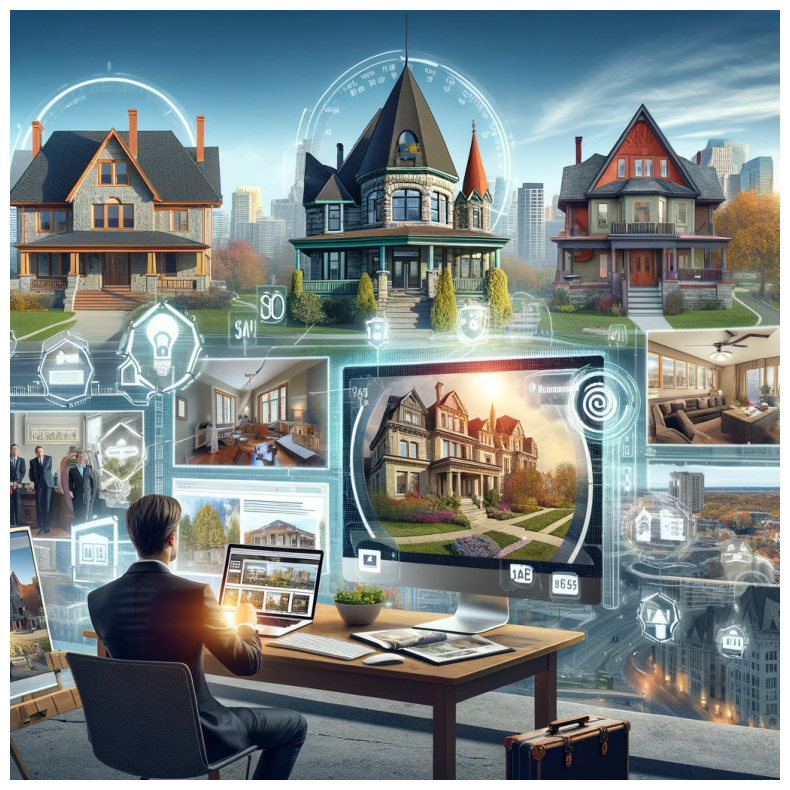

In [8]:
mostrar_imagen('C:\MachineLearningInmobiliario\housecomputer.png')

<span style="font-size:24px; color:red; font-weight:bold">Indice</span>

<span style="font-size:18px; color:red; font-weight:bold">0. Importación de librerias a utilizar y definición de funciones</span>

<span style="font-size:18px; color:red; font-weight:bold">1. Definición del problema</span>

    1.1 Introducción al problema que queremos abordar
    1.2 Descripción del dataset y sus variables

<span style="font-size:18px; color:red; font-weight:bold">2. Preparación de los datos</span>

    2.1 Importación de librerias a utilizar
    2.2 Carga del dataset y descripción de los datos
    2.3 Data Cleaning 

        2.3.1 Identificación valores nulos, duplicados, valores no utiles para el modelo o con poca varianza
        2.3.2 Analisis descriptivo univariante y bivariante
        2.3.3 Identificación de valores atípicos y definición de estrategias con ellos
        2.3.4 Data Transforms: Cambiando la escala o distribución de las variables

    2.4 Feature engineering: Creación de nuevas variables

    2.5 Feature Selection: Identificación de las variables más relevantes

        2.5.1 Filter Methods: Correlación, Chi-cuadrado y Anova
        2.5.2 Filter Methods empleando el metodo K-best
        2.5.3 Embedded Methods: RandomForest

        2.5.4 Conclusiones Feature Selection

    2.6 Reducción de la dimensionalidad de los datos

<span style="font-size:18px; color:red; font-weight:bold">3. Entrenamiento y evaluación de modelos</span>

    3.1 Elección de algoritmos de machine learning adecuados para el problema. 
    3.2 Entrenamiento de los modelos y evaluación de su rendimiento. 
    3.3 Selección de los dos mejores modelos y optimización (ajuste hiperparámetros).

<span style="font-size:18px; color:red; font-weight:bold">4. Modelo final</span>



<span style="font-size:18px; color:red; font-weight:bold">5. Conclusiones y recomendaciones</span>


<span style="font-size:24px; color:red; font-weight:bold">0. Importación de librerias a utilizar y definición de funciones</span>

In [1]:
# Librerias básicas:
import numpy as np
import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pylab
import matplotlib.ticker as mtick
import matplotlib.image as mpimg
from scipy.stats import shapiro, normaltest, kstest, jarque_bera
from scipy.stats import probplot
import scipy.stats as stats
from scipy.stats import mstats

# Feature Selection, Preprocesado, Modelos, Métricas, GridSearch:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.linear_model import LogisticRegressionCV 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score,f1_score,accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import load_digits
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.metrics import Precision, Recall

import warnings
warnings.filterwarnings("ignore")

In [5]:
# Funciones vamos a utilizar
import matplotlib.ticker as ticker

def plot_vector_charts(vector_cols, titulo):
    # Definir una paleta de colores personalizada
    color_palette = ["#800000", "#8000ff", "#6aac90", "#5833ff", "#da8829"]
    colors = ["#53D021", '#EB2325']
    
    # Configurar la figura con constrained_layout
    fig, axes = plt.subplots(len(vector_cols), 2, figsize=(20, 12))  # Aumentar el ancho de la figura
    fig.patch.set_facecolor("#f8f9f9")

    # Título del gráfico
    fig.suptitle(titulo, fontsize=10, fontweight='bold', fontfamily='serif', color="#000000")

    # Crear gráficos de pastel y de barras para cada columna categórica
    for i, col in enumerate(vector_cols):
        # Gráfico de pastel
        pie_ax = axes[i, 0]
        (df[col].value_counts() * 100.0 / len(df)).plot.pie(
            autopct=lambda p: f'{p:.1f}%', fontsize=8, ax=pie_ax, colors=color_palette, textprops={'color': 'black'})
        pie_ax.set_ylabel('')
        pie_ax.set_title(col, fontsize=8, backgroundcolor='skyblue')

        # Crear gráfico de barras con la media de 'median_house_value'
        bar_ax = axes[i, 1]
        col_data = df.groupby(col)['median_house_value'].mean().sort_index()
        ax = col_data.plot(kind='bar', color=colors, rot=0, ax=bar_ax)
        ax.set_title(f'', fontsize=8)  # Tamaño del título reducido
        ax.set_ylabel('Precio medio vivienda mediana bloque')

        # Añadir la media de 'median_house_value' como texto en cada barra
        for p in ax.patches:
            ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=8, color='red')

        # Añadir líneas discontinuas al eje y
        ax.grid(color='#000000', linestyle=':', axis='y', zorder=0, dashes=(1, 5))

    # Ajustar manualmente el diseño para aumentar el espacio vertical entre gráficos
    plt.subplots_adjust(hspace=0.6, wspace=0.2)  # Reducir el espacio horizontal entre subplots
    plt.show()

def plot_vector_chart(col, titulo):
    # Definir una paleta de colores personalizada
    color_palette = ["#800000", "#8000ff", "#6aac90", "#5833ff", "#da8829"]
    colors = ["#53D021", "#53D021"]
    
    # Configurar la figura con constrained_layout
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))  # Ajustar el tamaño de la figura
    fig.patch.set_facecolor("#f8f9f9")

    # Título del gráfico
    fig.suptitle(titulo, fontsize=14, fontweight='bold', fontfamily='serif', color="#000000")

    # Gráfico de pastel
    pie_ax = axes[0]
    (df[col].value_counts() * 100.0 / len(df)).plot.pie(
        autopct=lambda p: f'{p:.1f}%', fontsize=12, ax=pie_ax, colors=color_palette, textprops={'color': 'black'})
    pie_ax.set_ylabel('')
    pie_ax.set_title(col, fontsize=8, backgroundcolor='skyblue')

    # Crear gráfico de barras con la media de 'median_house_value'
    bar_ax = axes[1]
    col_data = df.groupby(col)['median_house_value'].mean().sort_index()
    ax = col_data.plot(kind='bar', color=colors, rot=0, ax=bar_ax)
    ax.set_title(f'Precio medio casa por {col}', fontsize=12)  # Tamaño del título reducido
    ax.set_ylabel('Precio medio vivienda')

    # Aplicar formato de millar español
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:,.0f}'.replace(',', '.')))

    # Añadir la media de 'median_house_value' como texto en cada barra
    for p in ax.patches:
        ax.annotate(f'{p.get_height():,.0f}'.replace(',', '.'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=8, color='red')

    # Añadir líneas discontinuas al eje y
    ax.grid(color='#000000', linestyle=':', axis='y', zorder=0, dashes=(1, 5))

    # Ajustar manualmente el diseño para aumentar el espacio vertical entre gráficos
    plt.subplots_adjust(hspace=0.6, wspace=0.2)  # Reducir el espacio horizontal entre subplots
    plt.show()


def mostrar_imagen(ruta_imagen):
    img = mpimg.imread(ruta_imagen)
    plt.figure(figsize=(12, 10))
    imgplot = plt.imshow(img)
    plt.axis('off')  # Desactivar los ejes
    plt.show()

def plot_chart(titulo):

    # Configurar la figura
    fig, ax = plt.subplots(figsize=(8, 4))
    background_color = "#f8f9f9"
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)

    # Crear el gráfico de barras horizontal
    sns.barplot(x='f1_score', y='Modelo', hue='Modelo', data=Model_com_df, ax=ax, palette='viridis', legend=False)

    # Añadir etiquetas y título
    ax.set_title(titulo, fontsize=10, fontweight='bold')
    ax.set_xlabel('f1_score', fontsize=12)
    ax.set_ylabel('Modelo', fontsize=12)

    # Añadir valores de f1_score a las barras con un decimal
    for p in ax.patches:
        width = p.get_width()
        ax.annotate(f'{width:.2f}', xy=(width, p.get_y() + p.get_height() / 2),
                xytext=(3, 0), textcoords="offset points", fontsize=8, fontweight='bold')

    # Mostrar el gráfico
    plt.show()

def evaluationModel(y_test, y_pred):
    # Calcular la matriz de confusión
    cn = confusion_matrix(y_test, y_pred)
    
    # Calcular el porcentaje de cada celda sobre el total de la fila
    cn_percent = cn / cn.sum(axis=1, keepdims=True) * 100
    
    # Nombres personalizados para las celdas
    names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    
    # Crear anotaciones combinadas de nombres, números absolutos y porcentajes
    combined_labels = np.array([f'{name}\n{value}\n{percent:.2f}%' for name, value, percent in zip(names, cn.flatten(), cn_percent.flatten())]).reshape(2, 2)
    
    # Crear el heatmap
    sns.heatmap(cn, annot=combined_labels, fmt='', cmap='Blues', cbar=False, xticklabels=['Predicted No Churn', 'Predicted Churn'], yticklabels=['Actual No Churn', 'Actual Churn'])
    
    # Añadir etiquetas y título
    plt.xlabel('Predicted Label')  
    plt.ylabel('True Label')  
    plt.title('Confusion Matrix') 
    plt.show()

<span style="font-size:24px; color:red; font-weight:bold">1. Definición del problema</span>

### 1.1 Introducción al problema que queremos abordar

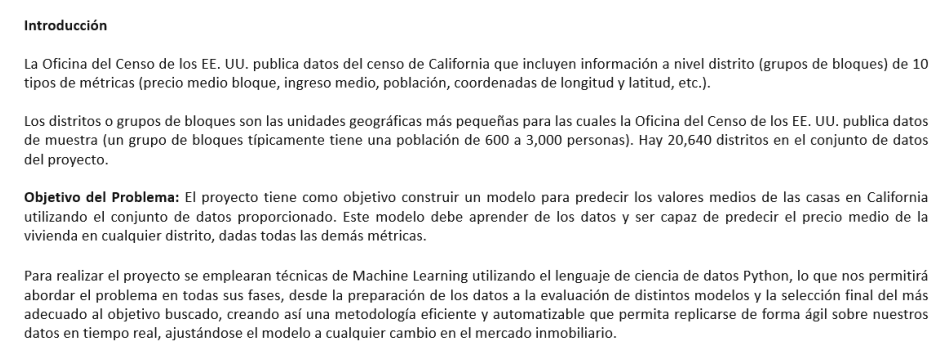

In [3]:
mostrar_imagen('C:\MachineLearningInmobiliario\Introduccion.png')

### 1.2 Descripción del dataset y sus variables

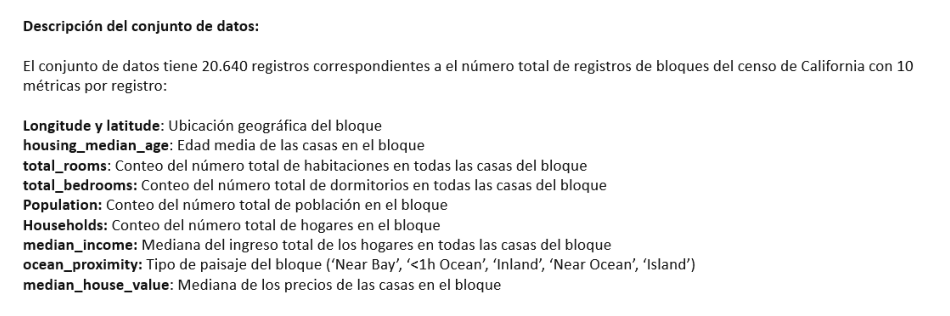

In [7]:
mostrar_imagen('C:\MachineLearningInmobiliario\Descripcion.png')

<span style="font-size:24px; color:red; font-weight:bold">2. Preparación de los datos</span>

### 2.2 Carga del dataset y descripción de los datos

In [8]:
# Importamos Dataset
df=pd.read_csv('C:\MachineLearningInmobiliario\housing.csv')

import locale

def formato_espanol(valor, decimales=0, simbolo=''):
    locale.setlocale(locale.LC_ALL, 'es_ES.UTF-8')
    numero_formateado = locale.format_string(f'%.{decimales}f', valor, grouping=True, monetary=True)
    return f'{simbolo}{numero_formateado}'

def highlight_alternate_rows(s):
    return ['background-color: #DDEBF7' if i % 2 == 0 else '' for i in range(len(s))]

styled_df = df.style.format(
    {
        'median_house_value': lambda x: formato_espanol(x, 0,'$'),
        'total_bedrooms': lambda x: formato_espanol(x, 0),
        'total_rooms': lambda x: formato_espanol(x, 0),
        'population': lambda x: formato_espanol(x, 0),
        'households': lambda x: formato_espanol(x, 0),
        'median_income': lambda x: formato_espanol(x, 2,'$')
    }
).apply(highlight_alternate_rows, axis=0)

# Para mostrar el DataFrame estilizado

#styled_df

In [10]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,INLAND,78100
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,INLAND,77100
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,INLAND,92300
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,INLAND,84700


### 2.3 Data Cleaning 

### 2.3.1 Identificación valores nulos, duplicados, valores no utiles para el modelo o con poca varianza

In [16]:
# dimension de los datos
print("El tamaño del dataset es : ", df.shape)
print("")

# Eliminamos columnas innecesarias si las hay
#df=df.drop(columns = ['',''],axis=1)

#Cambiamos nombres columnas con espacios
df.columns = df.columns.str.replace(' ', '_')

# Chequear valores duplicados
print("---- Duplicados ----")
print("Número de duplicados: " + str(df.duplicated().sum()))
print("")

#Valores nulos
dict = {}
for i in list(df.columns):
    dict[i] = df[i].isnull().mean() * 100

df_nulos=pd.DataFrame(dict,index=["% Valores nulos"]).transpose()

#Valores únicos
dict = {}
for i in list(df.columns):
    dict[i] = df[i].value_counts().shape[0]

df_unicos=pd.DataFrame(dict,index=["Valores únicos"]).transpose()

#Valores nulos conteo
dict = {}
for i in list(df.columns):
    dict[i] = df[i].isnull().sum()

df_num_nulos=pd.DataFrame(dict,index=["Valores nulos"]).transpose()

#type variable
dict = {}
for i in list(df.columns):
    dict[i] = df[i].dtype
    
df_type=pd.DataFrame(dict,index=["Type"]).transpose()

# Concatenar 
pd.concat([df_unicos,df_num_nulos,df_nulos, df_type ], axis=1)

El tamaño del dataset es :  (20640, 10)

---- Duplicados ----
Número de duplicados: 0



,Valores únicos,Valores nulos,% Valores nulos,Type
longitude,844,0,0.000000,float64
latitude,862,0,0.000000,float64
housing_median_age,52,0,0.000000,int64
total_rooms,5926,0,0.000000,int64
total_bedrooms,1923,207,1.002907,float64
population,3888,0,0.000000,int64
households,1815,0,0.000000,int64
median_income,12928,0,0.000000,float64
ocean_proximity,5,0,0.000000,object
median_house_value,3842,0,0.000000,int64


In [18]:
# Tenemos que ver primero que hacemos con esos valores nulos tras analizar las variables
df = df.dropna(subset=['total_bedrooms'])

In [20]:
# dimension de los datos
print("El tamaño del dataset es : ", df.shape)
print("")

El tamaño del dataset es :  (20433, 10)



In [24]:
# counts the total null values
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
dtype: int64

In [ ]:
# Categorizamos la variable objetivo

In [26]:
p30 = np.percentile(df['median_house_value'], 30)
p70 = np.percentile(df['median_house_value'], 70)
bins = [df['median_house_value'].min(), p30, p70, df['median_house_value'].max()]
labels = ['Bajo', 'Medio', 'Alto']
df['median_house_cat'] = pd.cut(df['median_house_value'], bins=bins, labels=labels, include_lowest=True)

In [28]:
grouped = df.groupby('median_house_cat')['median_house_value'].agg(['mean', 'std']).reset_index()

# Redondear las columnas 'mean' y 'std' a 0 decimales
grouped['mean'] = grouped['mean'].round(0)
grouped['std'] = grouped['std'].round(0)
grouped

,median_house_cat,mean,std
0,Bajo,93132.0,24281.0
1,Medio,182900.0,30730.0
2,Alto,352731.0,87168.0


In [ ]:
# Vamos a ordenar variable ocean_proximity de menor a mayor distancia al mar

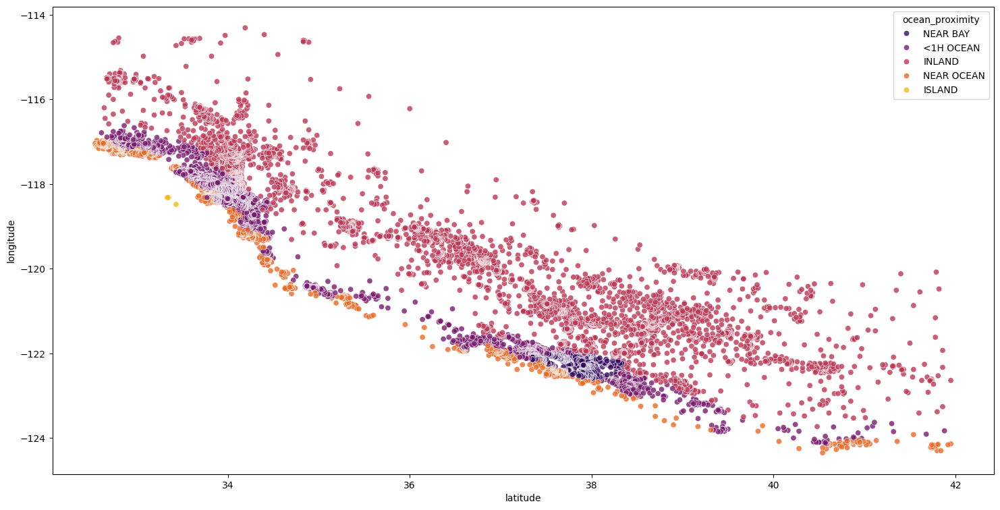

In [30]:
plt.figure(figsize=(18, 9))

# Create custom palette
cubehelix = sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=True, as_cmap=True)

# Create the scatter plot
sns.scatterplot(
    data=df, 
    x='latitude', 
    y='longitude', 
    hue='ocean_proximity', 
    #palette=cubehelix,
    palette='inferno',
    alpha=0.8
)

plt.show()

In [32]:
# Creamos categorias ordenadas en la variable ocean_proximity

# Definir el mapeo de las categorías a valores numéricos
proximity_mapping = {
    'INLAND': 5, # (Tierra adentro)
    'NEAR BAY': 3, # (Cerca de la bahía)
    'NEAR OCEAN': 2, # (Cerca del océano)
    '<1H OCEAN': 4, #  (A menos de 1 hora del océano)
    'ISLAND': 1 # (Isla)
}

# Aplicar el mapeo al DataFrame
df['ocean_proximity_encoded'] = df['ocean_proximity'].map(proximity_mapping)

In [34]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9034
INLAND        6496
NEAR OCEAN    2628
NEAR BAY      2270
ISLAND           5
Name: count, dtype: int64

### 2.3.2 Analisis descriptivo univariante y bivariante

In [36]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600,Alto,3
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500,Alto,3
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100,Alto,3
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300,Alto,3
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200,Alto,3
...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,INLAND,78100,Bajo,5
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,INLAND,77100,Bajo,5
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,INLAND,92300,Bajo,5
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,INLAND,84700,Bajo,5


In [ ]:
Vamos a crear un mapa 

In [38]:
import folium
from folium import plugins
import matplotlib.colors as mcolors
!pip install branca
from branca.colormap import LinearColormap

In [ ]:
Utilizamos la librería Folium de Python para crear un mapas web interactivo con el posicionamiento de los 20.640 bloques de viviendas

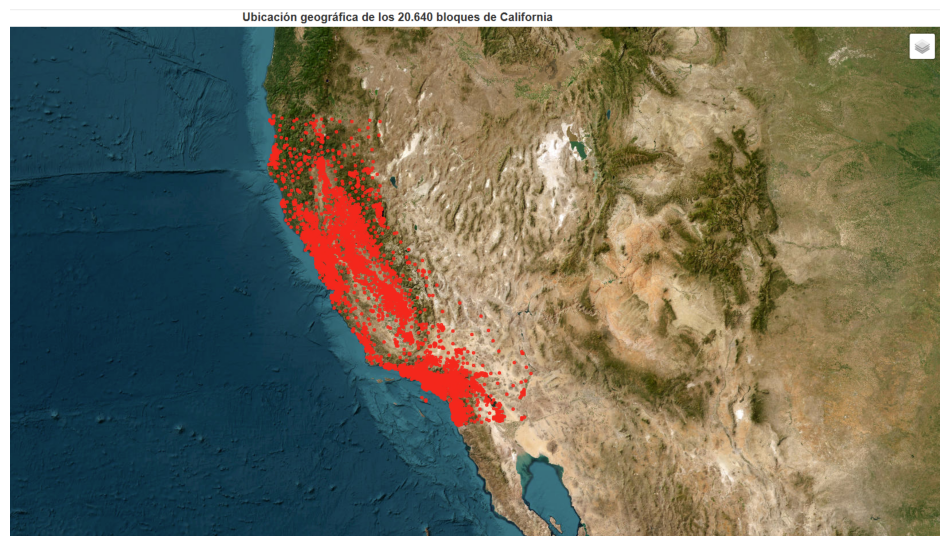

In [92]:
mostrar_imagen('C:\MachineLearningInmobiliario\MapaSatelite.png')

In [40]:
# Crear un mapa centrado en California con la capa de satélite de Esri como predeterminada
m = folium.Map(location=[36.7783, -119.4179], zoom_start=6, control_scale=True, tiles=None)

# Añadir la capa de satélite de Esri como capa base predeterminada
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Satellite',
    overlay=False,
    control=True
).add_to(m)

# Añadir OpenStreetMap como capa base alternativa
folium.TileLayer('openstreetmap', name='OpenStreetMap').add_to(m)

# Añadir puntos al mapa usando tu DataFrame df
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        popup=f"Ubicación: {row['latitude']}, {row['longitude']}",
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        weight=2
    ).add_to(m)

# Añadir título
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Ubicación geográfica de los 20.640 bloques de California</b></h3>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save('c:/MachineLearningInmobiliario/mapa_california.html')

Vamos a dividir las variables en binarias, categoricas, numéricas discretas y numéricas continuas.

In [44]:
# c) Variables categoricas
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
#categorical_cols = [col for col in categorical_cols if col != "var1" and col not in ['ciudad', 'estado','pais']]

df_categorical_cols = df[categorical_cols]

# d) Variables discretas
# Seleccionar columnas numéricas con menos de 12 valores únicos y más de 2 valores únicos
numerical_columns = df.select_dtypes(include=['number']).columns
discretas_cols = [col for col in numerical_columns if 2 < df[col].nunique() < 12]
discretas_cols

# e) Variables numéricas continuas  (con >=12 valores unicos)
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_cont_cols = [col for col in numerical_columns if df[col].nunique() >= 12 and col not in ['longitude', 'latitude']]
df_numerical_cont_cols = df[numerical_cont_cols]

In [46]:
numerical_cont_cols

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value']

In [48]:
categorical_cols

Index(['ocean_proximity', 'median_house_cat'], dtype='object')

In [50]:
discretas_cols

['ocean_proximity_encoded']

In [33]:
df['median_house_value']=df['median_house_value']*2

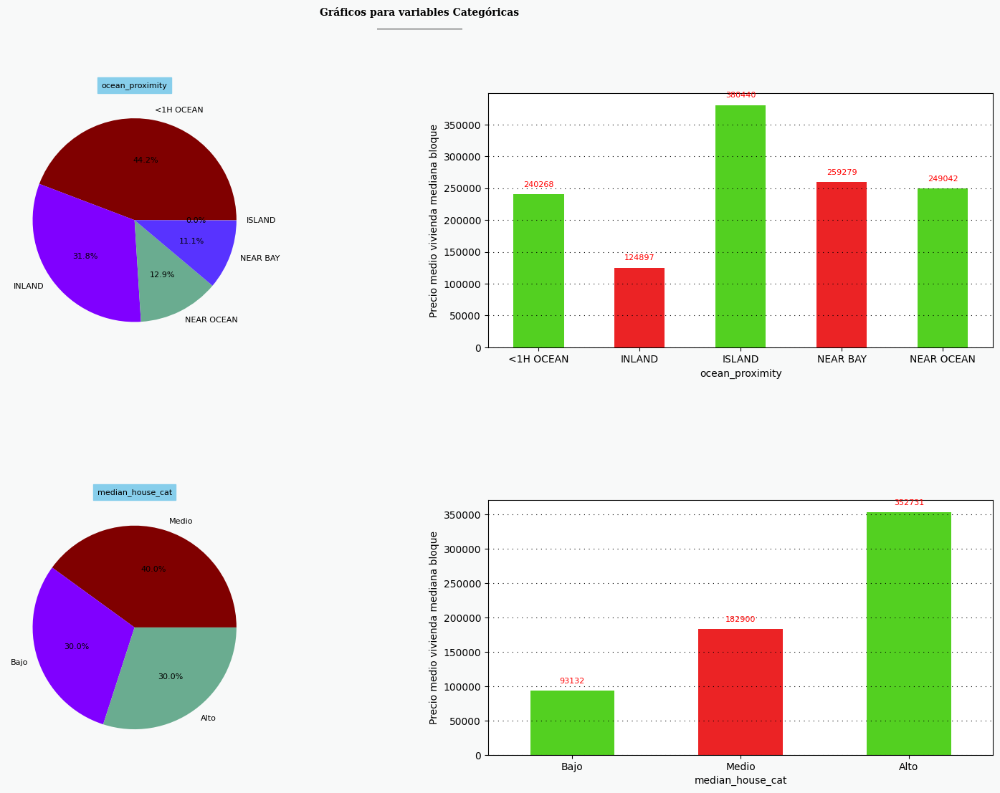

In [52]:
titulo = 'Gráficos para variables Categóricas\n_________________'
plot_vector_charts(categorical_cols, titulo)

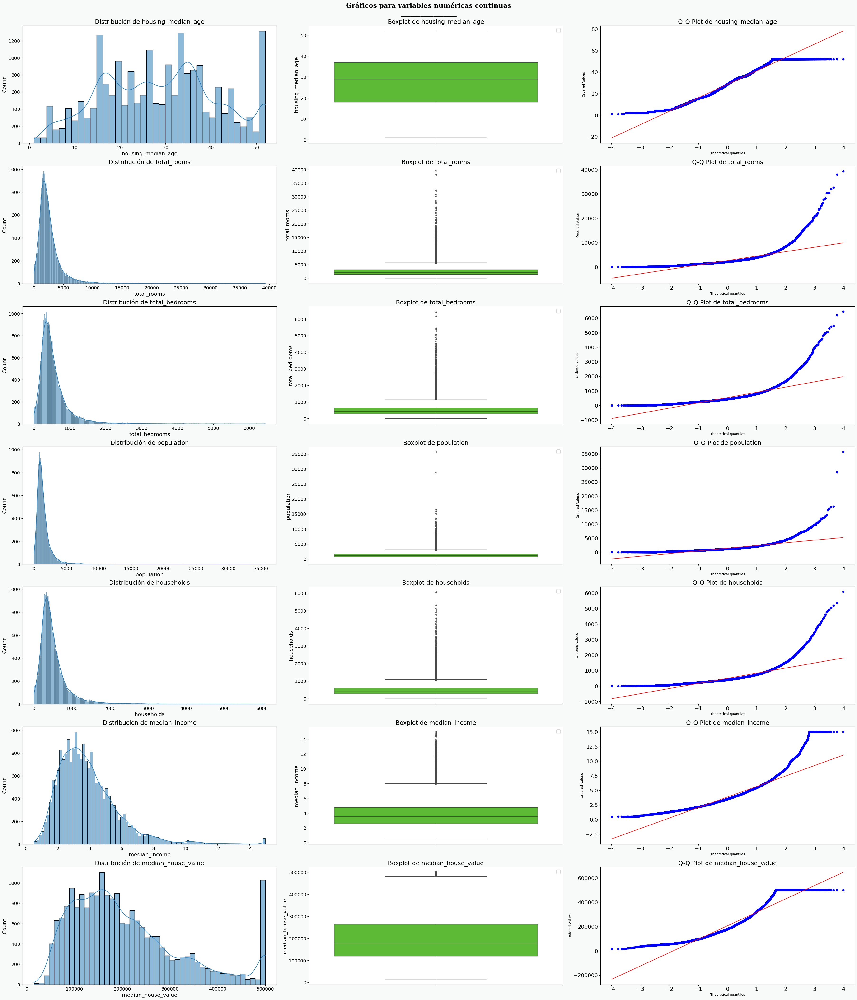

In [54]:
# Definir una paleta de colores personalizada
custom_palette = ["#800000", "#8000ff", "#6aac90", "#5833ff", "#da8829"]
bar_palette = {0: 'green', 1: 'red'}
colors = ["#53D021", "#EB2325"]

# Configurar la figura con constrained_layout
fig, axes = plt.subplots(len(numerical_cont_cols), 3, figsize=(36, len(numerical_cont_cols) * 6),
                         constrained_layout=True)
fig.patch.set_facecolor("#f8f9f9")

# Título del gráfico
fig.suptitle('Gráficos para variables numéricas continuas\n_________________', 
             fontsize=20, fontweight='bold', fontfamily='serif', color="#000000") 

# Crear gráficos de histograma con KDE, de caja y Q-Q plot para cada columna numérica continua
for i, col in enumerate(numerical_cont_cols):
    # Histograma con KDE
    hist_ax = axes[i, 0]
    sns.histplot(ax=hist_ax, x=col, data=df, kde=True, palette=bar_palette)
    hist_ax.set_xlabel(col, fontsize=16)  
    hist_ax.set_ylabel('Count', fontsize=16)  
    hist_ax.set_title(f'Distribución de {col}', fontsize=18) 
    hist_ax.tick_params(axis='both', which='major', labelsize=14) 

    # Gráfico de caja
    box_ax = axes[i, 1]
    sns.boxplot(ax=box_ax, y=col, data=df, palette=colors)
    box_ax.set_title(f'Boxplot de {col}', fontsize=18) 
    box_ax.set_ylabel(col, fontsize=16)  
    box_ax.legend([], fontsize=16)  
    box_ax.tick_params(axis='both', which='major', labelsize=14) 
    for s in ["top", "right", "left"]:
        box_ax.spines[s].set_visible(False)

    # Gráfico Q-Q
    qq_ax = axes[i, 2]
    stats.probplot(df[col], dist="norm", plot=qq_ax)
    qq_ax.set_title(f'Q-Q Plot de {col}', fontsize=18)
    qq_ax.tick_params(axis='both', which='major', labelsize=16)

plt.show()

In [78]:
numerical_cont_cols

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value']

La transformación Box-Cox es una técnica utilizada en estadística para estabilizar la varianza y hacer que los datos se asemejen más a una distribución normal. Esto es especialmente útil cuando se trabaja con modelos de regresión, ya que muchos métodos estadísticos asumen que los datos siguen una distribución normal.

In [60]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded
0,-122.23,37.88,41,15.711183,8.812635,12.313702,9.276867,2.339704,NEAR BAY,452600,Alto,3
1,-122.22,37.86,21,27.567255,17.043806,22.349787,18.837657,2.336226,NEAR BAY,358500,Alto,3
2,-122.24,37.85,52,18.129399,10.018273,14.089610,10.438155,2.173976,NEAR BAY,352100,Alto,3
3,-122.25,37.85,52,17.434442,10.726091,14.606008,11.216602,1.875594,NEAR BAY,341300,Alto,3
4,-122.25,37.85,52,18.653359,11.335470,14.661511,11.859220,1.434004,NEAR BAY,342200,Alto,3
...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,18.771858,12.396339,16.544107,12.835209,0.454096,INLAND,78100,Bajo,5
20636,-121.21,39.49,18,14.695478,9.269814,12.710336,8.952949,0.980434,INLAND,77100,Bajo,5
20637,-121.22,39.43,17,20.383726,13.409430,17.422049,14.000827,0.543777,INLAND,92300,Bajo,5
20638,-121.32,39.43,18,19.348787,12.738405,15.910079,13.069100,0.642702,INLAND,84700,Bajo,5


In [56]:
from scipy.stats import boxcox

# Aplicar la transformación Box-Cox
df['total_rooms'], best_lambda = boxcox(df['total_rooms'])
df['total_bedrooms'], best_lambda = boxcox(df['total_bedrooms'])
df['population'], best_lambda = boxcox(df['population'])
df['households'], best_lambda = boxcox(df['households'])
df['median_income'], best_lambda = boxcox(df['median_income'])

<Figure size 2000x2000 with 0 Axes>

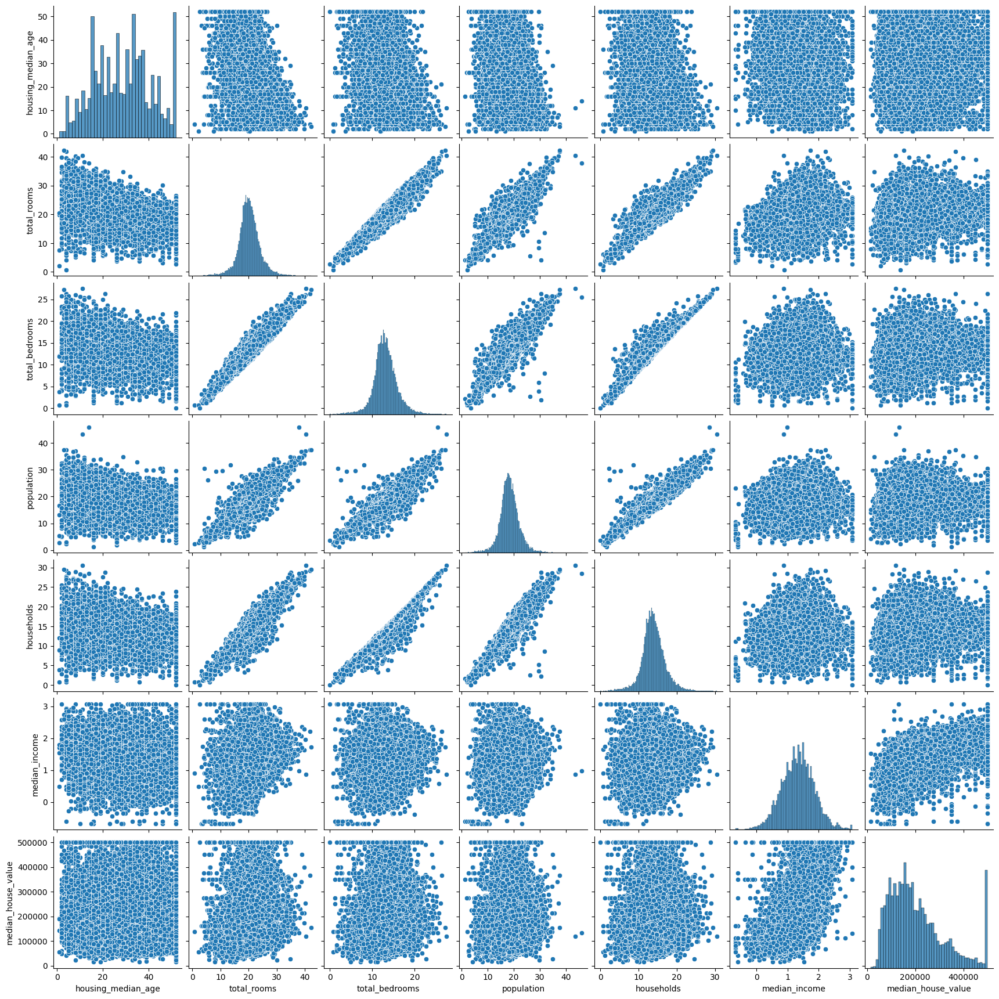

In [62]:
# Definir una paleta de colores personalizada
palette = {0: 'green', 1: 'red'}

# Configurar la figura
fig = plt.figure(figsize=(20, 20))
background_color = "#ffe6e6"
fig.patch.set_facecolor(background_color)


# Crear el pairplot
pairplot = sns.pairplot(df[numerical_cont_cols], palette=palette)

# Configurar el fondo de los ejes del pairplot
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')  # Fondo blanco para cada gráfico

# Fondo general
fig.patch.set_facecolor(background_color)

# Mostrar el gráfico
plt.show()

In [64]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Asumimos que df ya está definido con las columnas 'latitude', 'longitude', 'median_house_value', 'ocean_proximity_encoded', etc.
# Si no está definido, deberías cargarlo o crearlo aquí

# Función para crear la gráfica
def create_scatter_plot(variable):
    plt.figure(figsize=(9, 6))
    scatter = plt.scatter(df.longitude, df.latitude, c=df[variable], cmap='viridis')
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.colorbar(scatter, label=variable)
    plt.title(f"Scatter plot of {variable}")
    plt.show()

# Crear el menú desplegable
dropdown = widgets.Dropdown(
    options=['median_house_value', 'ocean_proximity_encoded', 'households', 'population'],
    value='median_house_value',
    description='Variable:',
)

# Crear un botón para actualizar el gráfico
update_button = widgets.Button(description="Actualizar Gráfico")

# Crear un widget de salida para mostrar el gráfico
output = widgets.Output()

# Función para actualizar la gráfica
def update_plot(b):
    with output:
        clear_output(wait=True)
        create_scatter_plot(dropdown.value)

# Conectar el botón con la función de actualización
update_button.on_click(update_plot)

# Crear el layout de los widgets
widgets_box = widgets.VBox([
    widgets.HTML("<h3>Seleccionar Variable</h3>"),
    dropdown,
    update_button
])

# Mostrar los widgets y el gráfico inicial
display(widgets.HBox([widgets_box, output]))

# Mostrar la gráfica inicial
with output:
    create_scatter_plot(dropdown.value)

### 2.3.3 Identificación de valores atípicos y definición de estrategias con ellos

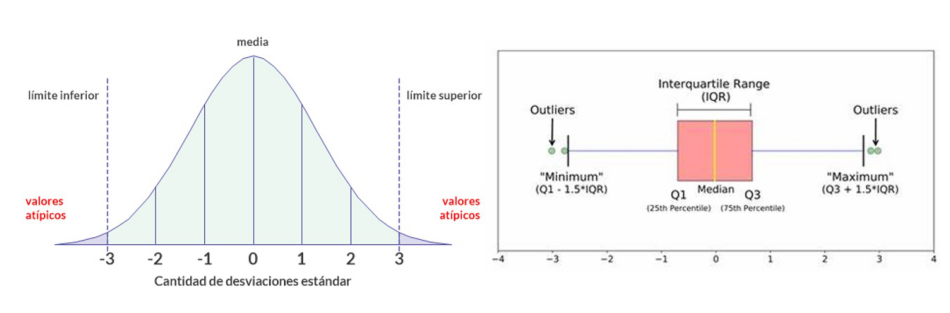

In [54]:
mostrar_imagen('c:/Phyton/CorrecionAtipicos.jpg')

Vamos a analizar la presencia de atípicos en las variables numéricas continuas , para lo que emplearemos dos metodos: IQR y +- 3 desv. tipicas

---- Outliers en variables númericas continuas ----

['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']



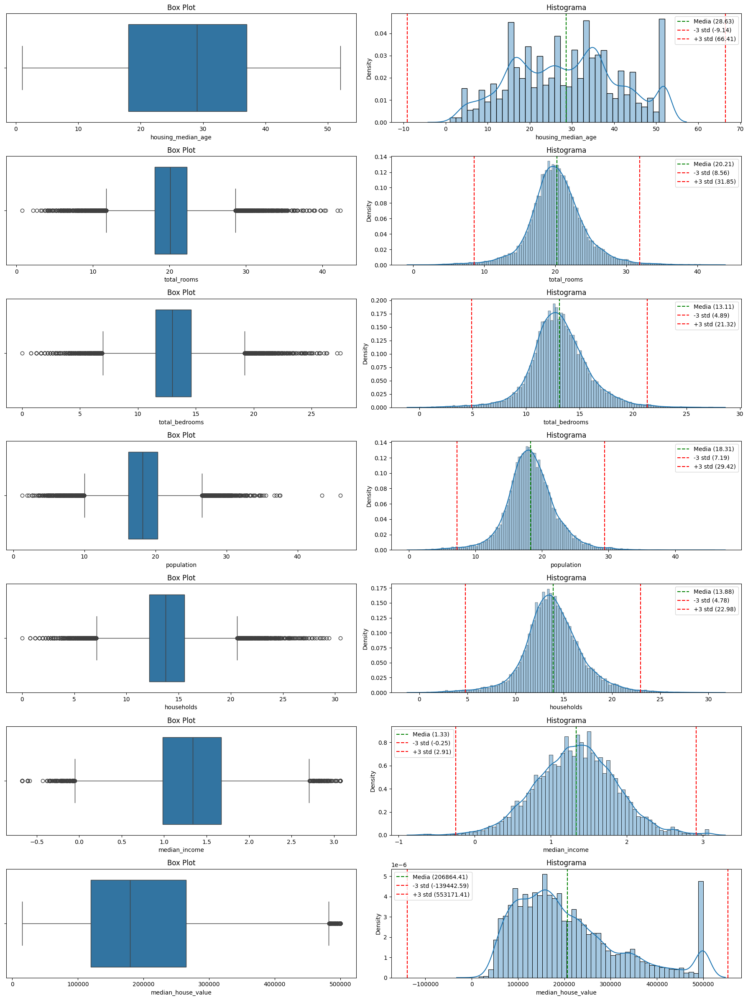

In [70]:
# Análisis de outliers

print("---- Outliers en variables númericas continuas ----")
print("")
print(numerical_cont_cols)
print("")

df_numerical_cont_cols = df[numerical_cont_cols]

fig, axes = plt.subplots(len(numerical_cont_cols), 2, figsize=(18, 24))

for i, col in enumerate(numerical_cont_cols):
    sns.boxplot(ax=axes[i, 0], x=df_numerical_cont_cols[col])
    axes[i, 0].set_title(f'Box Plot', fontsize=12)
    
    sns.histplot(ax=axes[i, 1], x=df_numerical_cont_cols[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 1].set_title(f'Histograma', fontsize=12)
    
    media = df_numerical_cont_cols[col].mean()
    std = df_numerical_cont_cols[col].std()
    axes[i, 1].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 1].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 1].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

In [72]:
# Definir el umbral para los valores atípicos (por ejemplo, 3 desviaciones estándar)
umbral = 3

outliers_data = {}

# Identificamos el número de outliers en cada variable
outliers_count_iqr = {}
outliers_count_std = {}

# Calculamos el número de outliers utilizando IQR
for col in numerical_cont_cols:
    
    media = df[col].mean()
    desviacion_estandar = df[col].std()
    
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_count_iqr[col] = {
        "lower outliers iqr": df[df[col] < lower_bound].shape[0],
        "upper outliers iqr": df[df[col] > upper_bound].shape[0]
    }

    outliers_count_std[col] = {
        "lower outliers std": df[df[col] < media - umbral * desviacion_estandar].shape[0],
        "upper outliers std": df[df[col] > media + umbral * desviacion_estandar].shape[0]
    }

In [74]:
# Conteo outliers por IQR
outliers_count_iqr=pd.DataFrame(outliers_count_iqr)

# Conteo outliers por +-3 std
outliers_count_std=pd.DataFrame(outliers_count_std)

pd.concat([outliers_count_std,outliers_count_iqr], axis=0)

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
lower outliers std,0,162,156,158,154,49,0
upper outliers std,0,156,148,152,145,73,0
lower outliers iqr,0,431,382,409,435,122,0
upper outliers iqr,0,498,446,436,446,139,1064


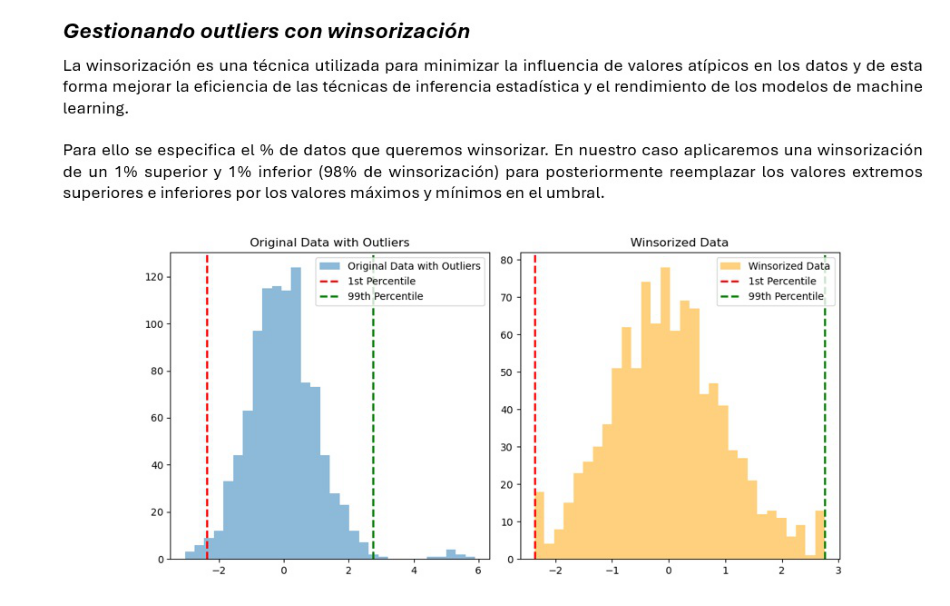

In [98]:
mostrar_imagen('c:/Phyton/Winsorizacion.jpg')

Columnas con outliers corregidos: ['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']


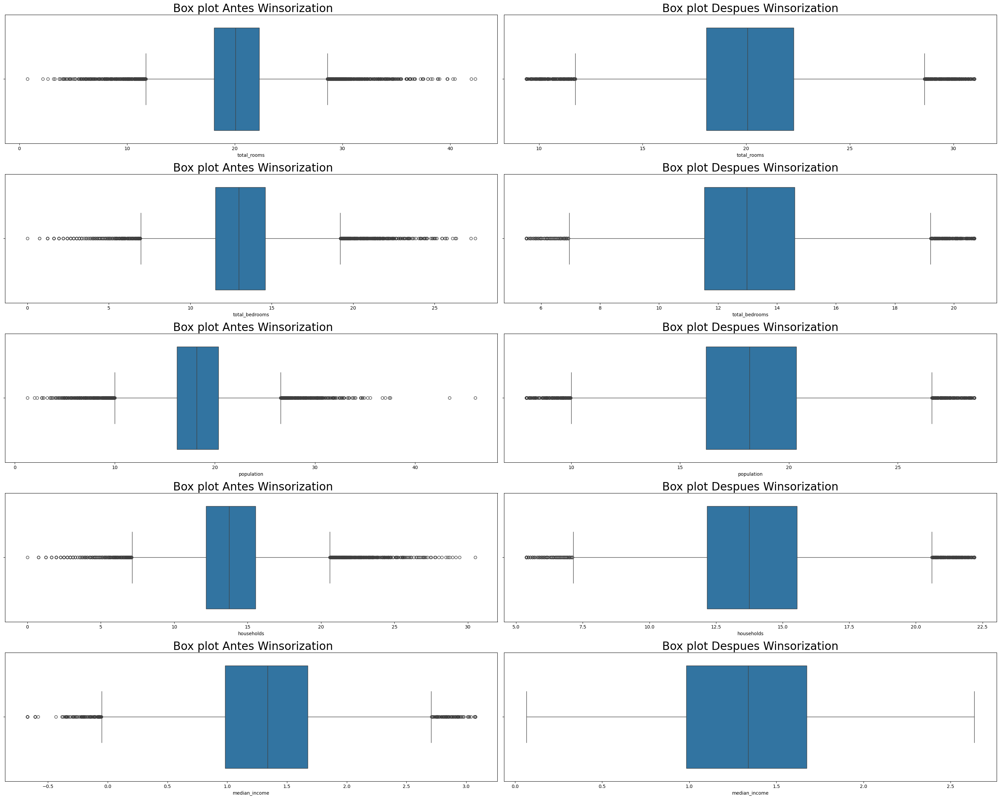

In [76]:
# Gestionando outliers con winsorización

# Seleccionamos aquellas columnas con outliers
outliers_count_std_sel=outliers_count_std.loc[:, outliers_count_std.sum() > 0]
outliers_count_std_sel
outliers_corregir = outliers_count_std_sel.columns.tolist()

print("Columnas con outliers corregidos:", outliers_corregir)

# Aplicamos la winsorización para tratar los outliers

for col in outliers_corregir:
    df[col] = mstats.winsorize(df[col], limits=[0.01, 0.01])

if len(outliers_corregir) == 1:
    fig, axes = plt.subplots(1, 2, figsize=(30, 24))
    axes = [axes]  # Convertir a lista para mantener la consistencia
else:
    fig, axes = plt.subplots(len(outliers_corregir), 2, figsize=(30, 24))

for i, col in enumerate(outliers_corregir):
    # Boxplot antes de la winsorización
    sns.boxplot(ax=axes[i][0], x=df_numerical_cont_cols[col])
    axes[i][0].set_title(f' Box plot Antes Winsorization', fontsize=24)

    # Boxplot después de la winsorización
    sns.boxplot(ax=axes[i][1], x=df[col])
    axes[i][1].set_title(f'Box plot Despues Winsorization', fontsize=24)

plt.tight_layout()
plt.show()

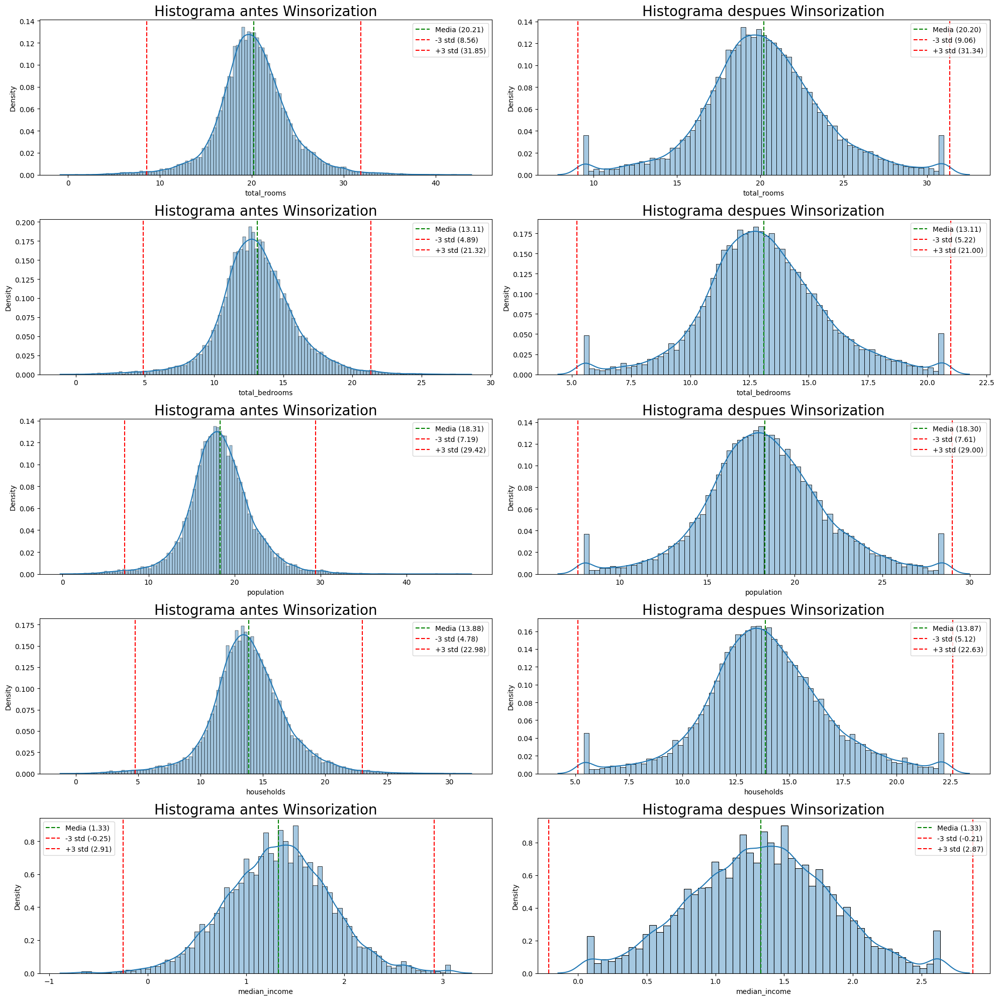

In [78]:
if len(outliers_corregir) == 1:
    fig, axes = plt.subplots(1, 2, figsize=(20, 20))
    axes = [axes]  # Convertir a lista para mantener la consistencia
else:
    fig, axes = plt.subplots(len(outliers_corregir), 2, figsize=(20, 20))

for i, col in enumerate(outliers_corregir):
    # Histograma antes de la winsorización
    sns.histplot(ax=axes[i, 0], x=df_numerical_cont_cols[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 0].set_title(f'Histograma antes Winsorization', fontsize=20)
    
    media = df_numerical_cont_cols[col].mean()
    std = df_numerical_cont_cols[col].std()
    axes[i, 0].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 0].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 0].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 0].legend()

    # Histograma despues de la winsorización
    sns.histplot(ax=axes[i, 1], x=df[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 1].set_title(f'Histograma despues Winsorization', fontsize=20)
    
    media = df[col].mean()
    std = df[col].std()
    axes[i, 1].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 1].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 1].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

### 2.3.4 Data Transforms: Cambiando la escala o distribución de las variables

El **feature scaling** (escalado de características) es una técnica de preprocesamiento de datos utilizada en machine learning para estandarizar las características (features) de un conjunto de datos. Esto es importante porque muchas veces las características tienen diferentes escalas y rangos, lo que puede afectar negativamente el rendimiento de algunos algoritmos de aprendizaje automático.

**¿Por qué es importante el Feature Scaling?**

- **Mejora el rendimiento del modelo:** Algoritmos como la regresión logística, SVM y KNN se ven afectados por la escala de las características. El escalado garantiza que todas las características contribuyan de manera equitativa al modelo.

- **Convergencia más rápida**: En algoritmos basados en gradiente descendente, como la regresión lineal y las redes neuronales, el escalado de características puede acelerar la convergencia.

- **Prevención de inestabilidad numérica:** Diferencias significativas en la escala de las características pueden causar problemas de inestabilidad numérica en cálculos como la distancia euclidiana.

**Métodos Comunes de Feature Scaling**

- **Normalización (Min-Max Scaling):** Escala las características para que estén en un rango específico, generalmente [0, 1].

- **Estandarización (Z-score Normalization):** Transforma las características para que tengan una media de 0 y una desviación estándar de 1.

- **Escalado por Máximo Absoluto:** Escala las características dividiendo por el valor absoluto máximo de cada característica. Útil cuando los datos contienen valores atípicos.


En nuestro caso aplicaremos, previo al entrenamiento de los distintos modelos que vamos a implementar, un escalado de las características aplicando la técnica **StandardScaler.**

**StandardScaler** es una técnica de preprocesamiento en el ámbito del aprendizaje automático que se utiliza para estandarizar las características de un conjunto de datos eliminando la media y escalando los datos para que tengan una varianza unitaria. Esto significa que transforma los datos de manera que su distribución tenga una media de cero y una desviación estándar de uno. 

Este proceso de estandarización es importante porque muchos algoritmos de aprendizaje automático funcionan mejor cuando las características se distribuyen normalmente, es decir, en forma de campana de Gauss con media cero y varianza unitaria.


**Transformación de variables categóricas:**

Para transformar las variables categóricas presentes en el dataframe usaremos las técnicas One-hot encoding y LabelEncoder, 
utilizadas en el procesamiento de datos para convertir valores categóricos en valores numéricos que los modelos de aprendizaje automático puedan entender mejor.

**One-hot encoding** es un proceso que convierte variables categóricas en una forma que se puede proporcionar a los algoritmos de ML para hacer un mejor trabajo en la predicción. Para cada valor único en una columna categórica, se crea una nueva columna binaria (0 o 1). Por otro lado, **LabelEncoder** asigna a cada valor único en la columna un número entero. Es más simple que One-hot encoding y se usa a menudo cuando la variable categórica es ordinal, lo que significa que hay un orden claro entre las categorías. Por ejemplo, si tenemos tamaños como “pequeño”, “mediano” y “grande”, LabelEncoder podría asignar 0 a “pequeño”, 1 a “mediano” y 2 a "grande"2.Ambos métodos son parte de la biblioteca de Python SciKit-learn, que es ampliamente utilizada en ciencia de datos y aprendizaje automático para preparar datos antes de entrenar modelos.



### 2.4 Feature engineering: Creación de nuevas variables

Vamos a realizar una segmentación intentando identificar zonas con comportamientos distintos respecto a las caracteristicas de los bloques

In [80]:
# 2. Segmentación

# a) Clustering con precio
from sklearn.cluster import KMeans
# Primero, escalamos las características para que estén en escalas comparables
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['latitude', 'longitude', 'median_house_value']])

# Ahora realizamos el clustering
kmeans = KMeans(n_clusters=8, random_state=42)
df['location_price_cluster'] = kmeans.fit_predict(scaled_features)

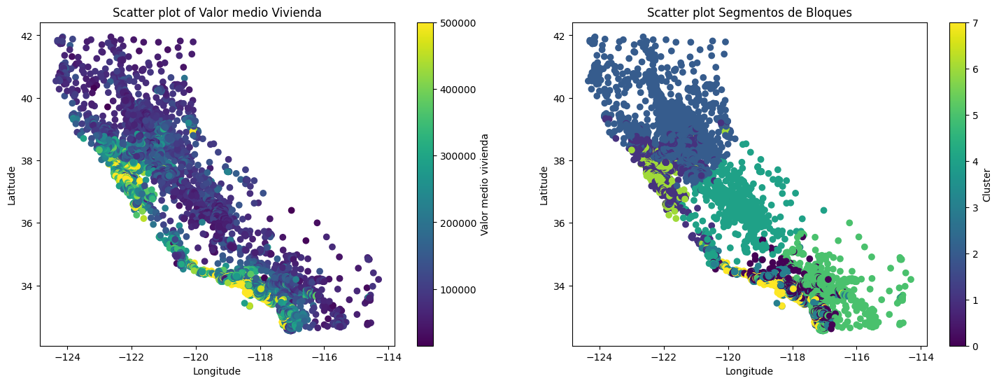

In [82]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

scatter1 = ax1.scatter(df.longitude, df.latitude, c=df['median_house_value'], cmap='viridis')
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
fig.colorbar(scatter1, ax=ax1, label="Valor medio vivienda")
ax1.set_title("Scatter plot of Valor medio Vivienda")

scatter2 = ax2.scatter(df.longitude, df.latitude, c=df['location_price_cluster'], cmap='viridis')
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
fig.colorbar(scatter2, ax=ax2, label="Cluster")
ax2.set_title("Scatter plot Segmentos de Bloques")

plt.show()


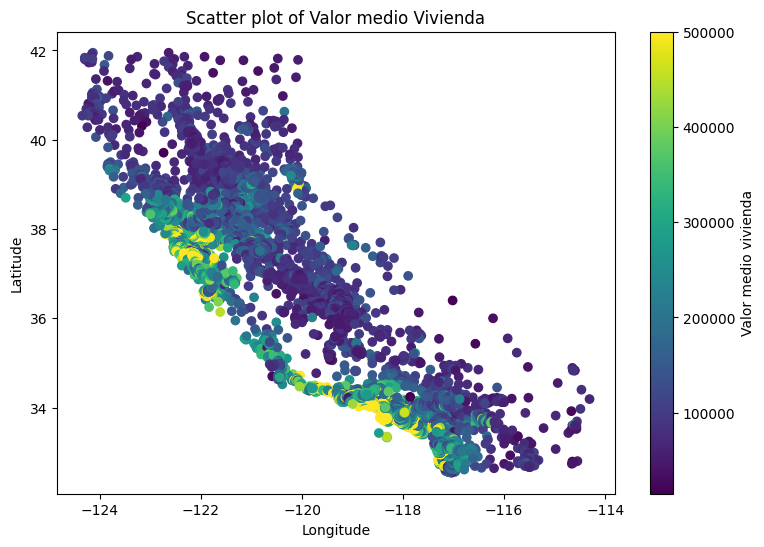

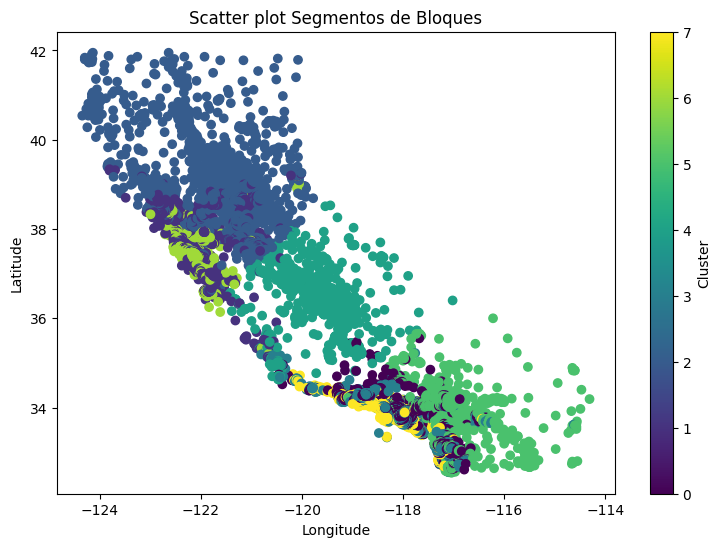

In [84]:
plt.figure(figsize=(9, 6))
scatter = plt.scatter(df.longitude, df.latitude, c=df['median_house_value'], cmap='viridis')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.colorbar(scatter, label="Valor medio vivienda")
plt.title(f"Scatter plot of Valor medio Vivienda")
plt.show()

plt.figure(figsize=(9, 6))
scatter = plt.scatter(df.longitude, df.latitude, c=df['location_price_cluster'], cmap='viridis')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.colorbar(scatter, label="Cluster")
plt.title(f"Scatter plot Segmentos de Bloques")
plt.show()

In [86]:
import folium
from folium import plugins
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors
!pip install branca
from branca.colormap import LinearColormap

In [ ]:
Mapa web con el posicionamiento de los 20.640 bloques de viviendas tramificado en función valor medio vivienda

In [90]:
# Crear un mapa centrado en California con la capa de calle como base
m = folium.Map(location=[36.7783, -119.4179], zoom_start=6, control_scale=True)

# Añadir capa de satélite
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Satellite',
    overlay=False,
    control=True
).add_to(m)

# Crear un objeto ColorMap de branca
colormap = LinearColormap(
    colors=['blue', 'green', 'yellow', 'red'],
    vmin=df['median_house_value'].min(),
    vmax=df['median_house_value'].max()
)

# Crear una capa de características para los puntos
points_layer = folium.FeatureGroup(name='House Values')

# Añadir puntos al mapa usando tu DataFrame df
for idx, row in df.iterrows():
    # Obtener el color correspondiente al valor de median_house_value
    color = colormap(row['median_house_value'])
    
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        popup=f"Ubicación: {row['latitude']:.4f}, {row['longitude']:.4f}<br>Valor: ${row['median_house_value']:,.2f}",
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        weight=2
    ).add_to(points_layer)

# Añadir la capa de puntos al mapa
points_layer.add_to(m)

# Añadir minimapa
minimap = plugins.MiniMap()
m.add_child(minimap)

# Añadir la leyenda de colores al mapa
colormap.add_to(m)
colormap.caption = 'Valor medio de la vivienda ($)'

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save('C:/MachineLearningInmobiliario/mapa_california_median.html')

In [92]:
# Crear un mapa centrado en California con la capa de calle como base
m = folium.Map(location=[36.7783, -119.4179], zoom_start=6, control_scale=True)

# Añadir capa de satélite
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Satellite',
    overlay=False,
    control=True
).add_to(m)

# Crear un objeto ColorMap de branca
colormap = LinearColormap(
    colors=['blue', 'green', 'yellow', 'red'],
    vmin=df['location_price_cluster'].min(),
    vmax=df['location_price_cluster'].max()
)

# Crear una capa de características para los puntos
points_layer = folium.FeatureGroup(name='House Values')

# Añadir puntos al mapa usando tu DataFrame df
for idx, row in df.iterrows():
    # Obtener el color correspondiente al valor de median_house_value
    color = colormap(row['location_price_cluster'])
    
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        popup=f"Ubicación: {row['latitude']:.4f}, {row['longitude']:.4f}<br>Valor: ${row['location_price_cluster']:,.2f}",
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        weight=2
    ).add_to(points_layer)

# Añadir la capa de puntos al mapa
points_layer.add_to(m)

# Añadir minimapa
minimap = plugins.MiniMap()
m.add_child(minimap)

# Añadir la leyenda de colores al mapa
colormap.add_to(m)
colormap.caption = 'location_price_cluster'

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save('C:/MachineLearningInmobiliario/mapa_california_cluster.html')

In [114]:
# Crear un mapa centrado en California
m = folium.Map(location=[36.7783, -119.4179], zoom_start=6)

# Crear un objeto ColorMap de branca
colormap = LinearColormap(
    colors=['blue', 'green', 'yellow', 'red'],
    vmin=df['location_price_cluster'].min(),
    vmax=df['location_price_cluster'].max()
)

# Añadir puntos al mapa usando tu DataFrame df
for idx, row in df.iterrows():
    # Obtener el color correspondiente al valor de median_house_value
    color = colormap(row['location_price_cluster'])
    
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        popup=f"Ubicación: {row['latitude']:.4f}, {row['longitude']:.4f}<br>Valor: ${row['location_price_cluster']:,.2f}",
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        weight=2
    ).add_to(m)

# Añadir minimapa
minimap = plugins.MiniMap()
m.add_child(minimap)

# Añadir la leyenda de colores al mapa
colormap.add_to(m)
colormap.caption = 'Valor medio de la vivienda ($)'

# Guardar el mapa en un archivo HTML
m.save('c:/Phyton/mapa_california_colored_cluster.html')

### 2.5 Feature Selection: Identificación de las variables más relevantes

mostrar_imagen('c:/Phyton/FeatureSelection.jpg')

### 2.5.1 Filter Methods

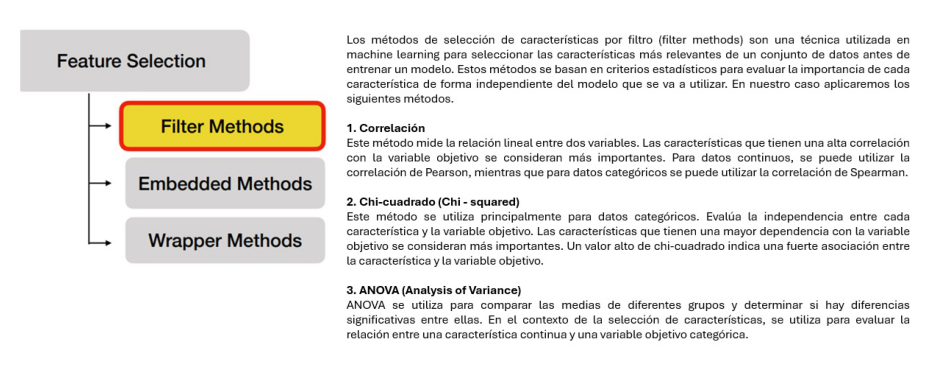

In [69]:
mostrar_imagen('c:/Phyton/FilterMethods.jpg')

#### 2.5.1 Filter Methods: Correlación, Chi-cuadrado y Anova

In [94]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded,location_price_cluster
0,-122.23,37.88,41,15.711183,8.812635,12.313702,9.276867,2.339704,NEAR BAY,452600,Alto,3,6
1,-122.22,37.86,21,27.567255,17.043806,22.349787,18.837657,2.336226,NEAR BAY,358500,Alto,3,6
2,-122.24,37.85,52,18.129399,10.018273,14.089610,10.438155,2.173976,NEAR BAY,352100,Alto,3,6
3,-122.25,37.85,52,17.434442,10.726091,14.606008,11.216602,1.875594,NEAR BAY,341300,Alto,3,6
4,-122.25,37.85,52,18.653359,11.335470,14.661511,11.859220,1.434004,NEAR BAY,342200,Alto,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,18.771858,12.396339,16.544107,12.835209,0.454096,INLAND,78100,Bajo,5,2
20636,-121.21,39.49,18,14.695478,9.269814,12.710336,8.952949,0.980434,INLAND,77100,Bajo,5,2
20637,-121.22,39.43,17,20.383726,13.409430,17.422049,14.000827,0.543777,INLAND,92300,Bajo,5,2
20638,-121.32,39.43,18,19.348787,12.738405,15.910079,13.069100,0.642702,INLAND,84700,Bajo,5,2


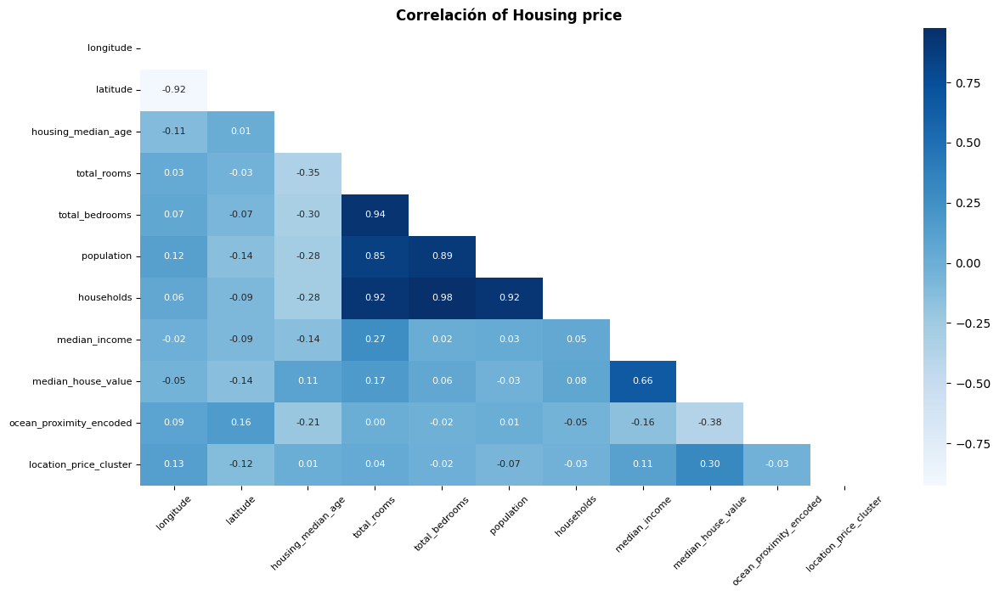

Correlation with var obj : 
median_income              0.66
location_price_cluster     0.30
total_rooms                0.17
housing_median_age         0.11
households                 0.08
total_bedrooms             0.06
population                -0.03
longitude                 -0.05
latitude                  -0.14
ocean_proximity_encoded   -0.38
Name: median_house_value, dtype: float64

Variables con significación >= 0.05 con Exited: 
median_income              0.66
location_price_cluster     0.30
total_rooms                0.17
housing_median_age         0.11
households                 0.08
total_bedrooms             0.06
longitude                 -0.05
latitude                  -0.14
ocean_proximity_encoded   -0.38
Name: median_house_value, dtype: float64


In [96]:
# Variables numericas

# Usaremos una correlation matrix heatmap para visualizar las correlaciones entre las variables numericas
# Podemos visualizar las correlaciones entre variables utilizando una matriz de correlación (heatmap)
# Calcular la matriz de correlación
corr = df.select_dtypes(include=['int', 'float']).corr()

# Crear una máscara para la mitad superior
mask = np.triu(np.ones_like(corr, dtype=bool))

# Configurar la figura
plt.figure(figsize=(14, 7))

# Crear el heatmap con la máscara
sns.heatmap(corr, mask=mask, annot=True, center=0, cmap='Blues', fmt='.2f', annot_kws={'size': 8})

# Ajustar el tamaño de las etiquetas
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xticks(rotation=45)
plt.title("Correlación of Housing price", loc="center", fontweight='bold')
plt.show()

# Ｃorrelation with Ｅxited
correlation_with_var_obj = (df.select_dtypes(include=['int', 'float']).corr()['median_house_value']).round(2)
# Excluir var obj
correlation_with_var_obj = correlation_with_var_obj[correlation_with_var_obj.index != 'median_house_value']
sorted_correlation = correlation_with_var_obj.sort_values(ascending=False)
print(f'Correlation with var obj : \n{sorted_correlation}')

# Seleccionar solo las que tengan valores >= 0.05
selected_variables = sorted_correlation[(sorted_correlation >= 0.05) | (sorted_correlation <= -0.05)]
print()
print(f'Variables con significación >= 0.05 con Exited: \n{selected_variables}')

             Var1            Var2  Correlacion
0        latitude       longitude    -0.924616
1  total_bedrooms     total_rooms     0.936712
2      population     total_rooms     0.853627
3      population  total_bedrooms     0.891532
4      households     total_rooms     0.924980
5      households  total_bedrooms     0.976697
6      households      population     0.923773


<Axes: >

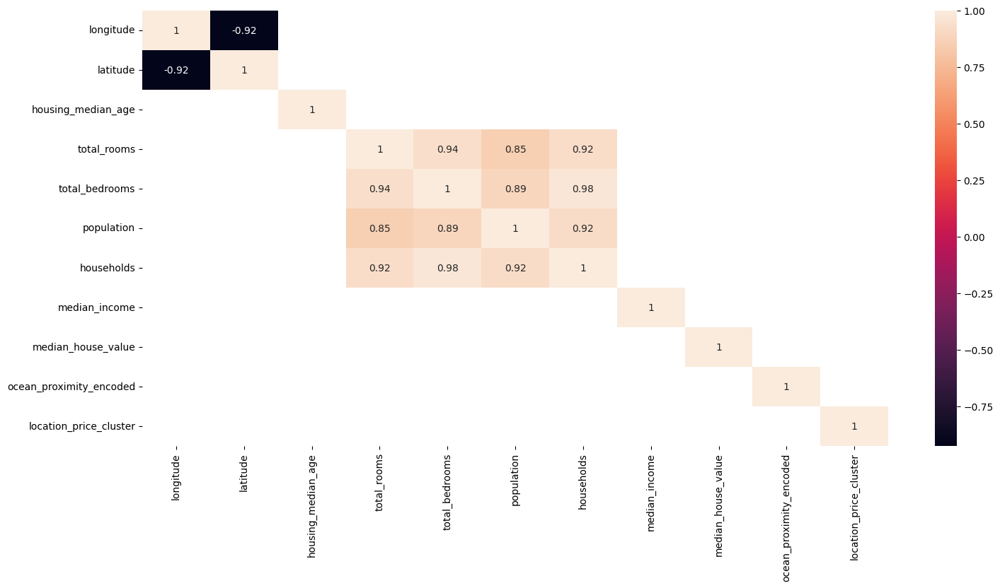

In [98]:
# Highly correlated columns
corr = df.select_dtypes(include=['int', 'float']).corr()

# Filtrar las correlaciones que cumplen la condición
filtered_corr = corr[(corr > 0.7) | (corr < -0.7)]

# Construir el DataFrame con los pares de variables y sus correlaciones
pairs = []
for i in range(len(filtered_corr.columns)):
    for j in range(i):
        if abs(filtered_corr.iloc[i, j]) > 0.7:
            pairs.append((filtered_corr.index[i], filtered_corr.columns[j], filtered_corr.iloc[i, j]))

# Crear el DataFrame
df_pairs = pd.DataFrame(pairs, columns=['Var1', 'Var2', 'Correlacion'])

# Mostrar el DataFrame
print(df_pairs)

plt.figure(figsize = (17,8))
sns.heatmap(corr[(corr>0.7)|(corr<-0.7)], annot = True)

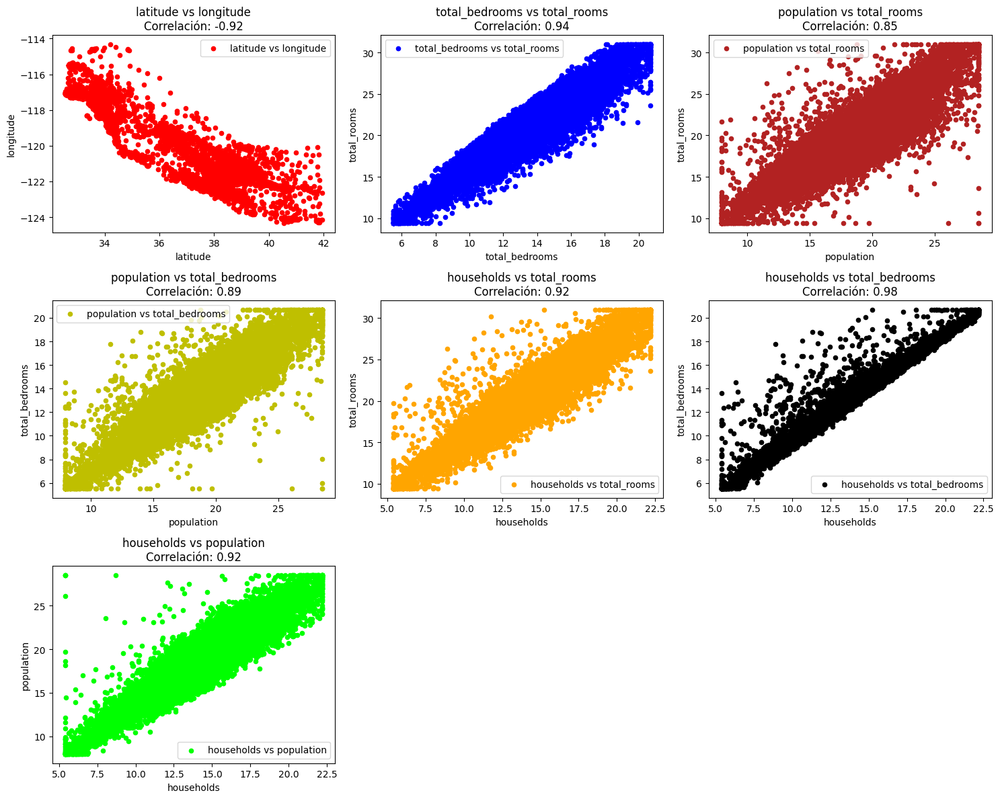

In [100]:
# Crear la figura y los ejes
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))  # Dividir la ventana en mini gráficos
axes = axes.ravel()  # Aplanar la matriz de ejes

# Extraer las columnas de df_pairs
cols = df_pairs['Var1']
cols_1 = df_pairs['Var2']
correlations = df_pairs['Correlacion']
colors = ['r', 'b', 'firebrick', 'y', 'orange', 'black', 'lime']

# Iterar sobre los pares de variables y crear los gráficos de dispersión
for col, col_1, corr, ax, color in zip(cols, cols_1, correlations, axes, colors):
    df.plot(kind='scatter', x=col, y=col_1, ax=ax, color=color, label=f'{col} vs {col_1}', title=f'{col} vs {col_1}\nCorrelación: {corr:.2f}')
    ax.legend()

# Eliminar ventanas vacías si es necesario
if len(cols) < len(axes):
    for i in range(len(cols), len(axes)):
        fig.delaxes(axes[i])

fig.tight_layout()
plt.show()

In [ ]:
Alta correlacion entre total_rooms, population, total_bedrooms y households

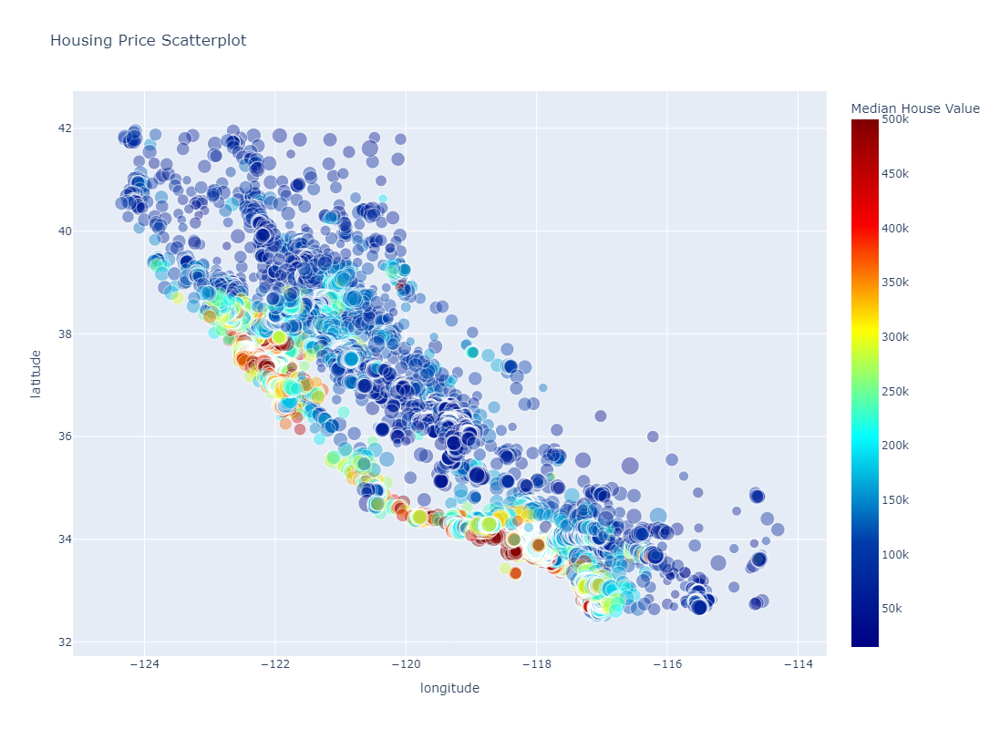

In [102]:
import plotly.express as px

fig = px.scatter(df, x='longitude', y='latitude', size='population', 
                 color='median_house_value', color_continuous_scale='jet',
                 labels={'median_house_value': 'Median House Value'},
                 title='Housing Price Scatterplot',
                 opacity=0.4, size_max=20)

# Actualizar el layout para hacer el gráfico más alto
fig.update_layout(height=800) 

fig.show()


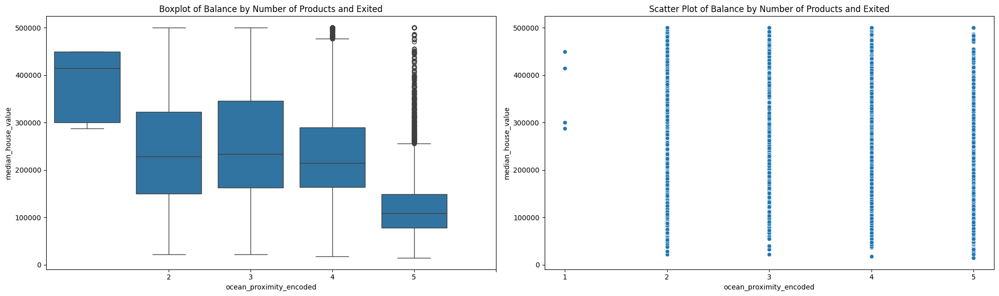

In [104]:
# Analizamos 

# Crear subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Crear el boxplot
sns.boxplot(ax=axes[0], x='ocean_proximity_encoded', y='median_house_value', data=df)
axes[0].set_title('Boxplot of Balance by Number of Products and Exited')
axes[0].set_xlabel('ocean_proximity_encoded')
axes[0].set_ylabel('median_house_value')
axes[0].set_xticks(df['ocean_proximity_encoded'].unique())  # Asegurar que las etiquetas del eje x sean discretas

# Crear el gráfico de dispersión
sns.scatterplot(ax=axes[1], x='ocean_proximity_encoded', y='median_house_value', data=df, palette=colors)
axes[1].set_title('Scatter Plot of Balance by Number of Products and Exited')
axes[1].set_xlabel('ocean_proximity_encoded')
axes[1].set_ylabel('median_house_value')
axes[1].set_xticks(df['ocean_proximity_encoded'].unique())  # Asegurar que las etiquetas del eje x sean discretas

# Ajustar el diseño
plt.tight_layout()
plt.show()

In [106]:
# Mostrar variables que tengan alta correlación entre ellas

print()
print(f'Pares de Variables con significación >= 0.10 o <= -0.10: \n')

# Calcular la matriz de correlación
corr_matrix = df.select_dtypes(include=['int', 'float']).drop(columns=['median_house_value']).corr().round(2)

# Filtrar los pares de valores con correlación > 0.1 o < -0.1
threshold = 0.1
filtered_pairs = corr_matrix[(corr_matrix > threshold) | (corr_matrix < -threshold)]

# Convertir la matriz filtrada a un formato de pares
pairs = filtered_pairs.stack().reset_index()
pairs.columns = ['Variable1', 'Variable2', 'Correlation']

# Eliminar los pares duplicados y los pares de la diagonal (correlación de una variable consigo misma)
pairs = pairs[pairs['Variable1'] != pairs['Variable2']]
pairs = pairs.drop_duplicates(subset=['Correlation'])

# Mostrar los resultados
print(pairs)



Pares de Variables con significación >= 0.10 o <= -0.10: 

             Variable1                Variable2  Correlation
1            longitude                 latitude        -0.92
2            longitude       housing_median_age        -0.11
3            longitude               population         0.12
4            longitude   location_price_cluster         0.13
7             latitude               population        -0.14
8             latitude  ocean_proximity_encoded         0.16
9             latitude   location_price_cluster        -0.12
12  housing_median_age              total_rooms        -0.35
13  housing_median_age           total_bedrooms        -0.30
14  housing_median_age               population        -0.28
17  housing_median_age  ocean_proximity_encoded        -0.21
20         total_rooms           total_bedrooms         0.94
21         total_rooms               population         0.85
22         total_rooms               households         0.92
23         total_rooms   

#### 2.5.2 Filter Methods empleando el metodo K-best

Para seleccionar las variables más significativas con el metodo K-best usaremos Chi-cuadrado (sin discretización
y con discretización de las variables númericas) y f_classif para realizar una prueba de ANOVA.

In [108]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded,location_price_cluster
0,-122.23,37.88,41,15.711183,8.812635,12.313702,9.276867,2.339704,NEAR BAY,452600,Alto,3,6
1,-122.22,37.86,21,27.567255,17.043806,22.349787,18.837657,2.336226,NEAR BAY,358500,Alto,3,6
2,-122.24,37.85,52,18.129399,10.018273,14.089610,10.438155,2.173976,NEAR BAY,352100,Alto,3,6
3,-122.25,37.85,52,17.434442,10.726091,14.606008,11.216602,1.875594,NEAR BAY,341300,Alto,3,6
4,-122.25,37.85,52,18.653359,11.335470,14.661511,11.859220,1.434004,NEAR BAY,342200,Alto,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,18.771858,12.396339,16.544107,12.835209,0.454096,INLAND,78100,Bajo,5,2
20636,-121.21,39.49,18,14.695478,9.269814,12.710336,8.952949,0.980434,INLAND,77100,Bajo,5,2
20637,-121.22,39.43,17,20.383726,13.409430,17.422049,14.000827,0.543777,INLAND,92300,Bajo,5,2
20638,-121.32,39.43,18,19.348787,12.738405,15.910079,13.069100,0.642702,INLAND,84700,Bajo,5,2


In [110]:
X = df.drop(['median_house_cat','ocean_proximity','median_house_value'], axis=1)
y = df['median_house_cat']
# Discretizar las variables numéricas para chi-cuadrado
discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='uniform')
X_discretized = discretizer.fit_transform(X)

# Crear selectores de características
selectors = {
    'chi2': SelectKBest(score_func=mutual_info_classif, k=4),
    'chi2 discretizado': SelectKBest(score_func=chi2, k=4),
    'f_classif': SelectKBest(score_func=f_classif, k=4),
}

# DataFrame para almacenar los resultados
results = pd.DataFrame(0, index=selectors.keys(), columns=X.columns)

# Aplicar cada selector y almacenar los resultados
for method, selector in selectors.items():
    if method == 'chi2 discretizado':
        X_new = selector.fit_transform(X_discretized, y)
    else:
        X_new = selector.fit_transform(X, y)
    
    selected_features = selector.get_support(indices=True)
    results.loc[method, [X.columns[i] for i in selected_features]] = 1

#Transponer el DataFrame 'results'
results_transposed = results.T

# Añadir una columna de suma con el total
results_transposed['Total'] = results_transposed.sum(axis=1)

# Ordenar el DataFrame en orden descendente por la columna 'Total'
results_Kbest = results_transposed.sort_values(by='Total', ascending=False)
print('Feature Selection: Univariante Feature Selection (SelectKbest) (1:Feature seleccionada , 0: No seleccionada)')
print('--------------------------')
print(results_Kbest)

Feature Selection: Univariante Feature Selection (SelectKbest) (1:Feature seleccionada , 0: No seleccionada)
--------------------------
                         chi2  chi2 discretizado  f_classif  Total
latitude                    1                  1          1      3
median_income               1                  1          1      3
location_price_cluster      1                  1          1      3
ocean_proximity_encoded     0                  1          1      2
longitude                   1                  0          0      1
housing_median_age          0                  0          0      0
total_rooms                 0                  0          0      0
total_bedrooms              0                  0          0      0
population                  0                  0          0      0
households                  0                  0          0      0


In [112]:
# Seleccionamos las filas donde Total >= 2
filtered_df = results_Kbest[results_Kbest['Total'] >= 2]

# Convertimos el índice de las filas seleccionadas en una lista
Best_results_kbest = filtered_df.index.tolist()

print("Las variables que han sido seleccionadas entre las 10 más significativas por Kbest son:\n")
print(Best_results_kbest)

# Seleccionamos las filas donde Total = 0
filtered_df2 = results_Kbest[results_Kbest['Total'] == 0]

# Convertimos el índice de las filas seleccionadas en una lista
Worst_results_kbest = filtered_df2.index.tolist()

print("----------------------")
print("Las variables que no han sido seleccionadas entre las 10 más significativas por Kbest son:\n")
print(Worst_results_kbest)

Las variables que han sido seleccionadas entre las 10 más significativas por Kbest son:

['latitude', 'median_income', 'location_price_cluster', 'ocean_proximity_encoded']
----------------------
Las variables que no han sido seleccionadas entre las 10 más significativas por Kbest son:

['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households']


### 2.5.3 Embedded Methods: RandomForest

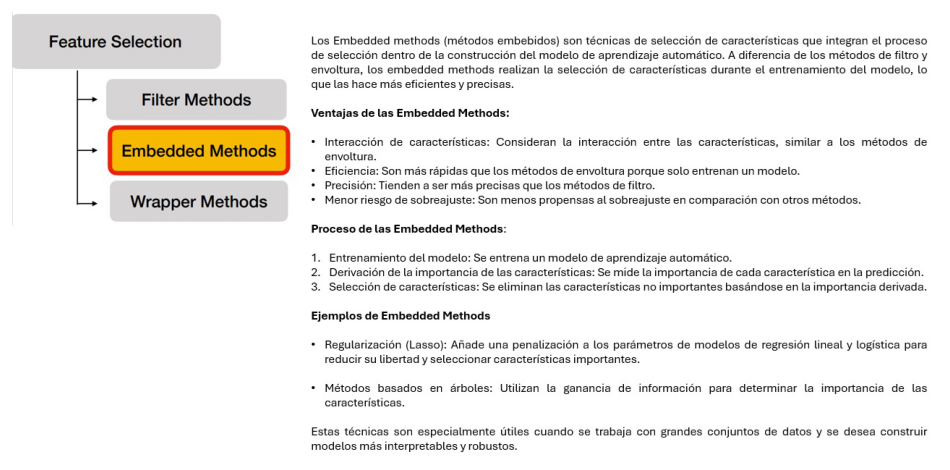

In [114]:
mostrar_imagen('c:/Phyton/Embedded Methods.jpg')

In [ ]:
En nuestro caso entrenaremos un modelo RandomForest para seleccionar las mejores caracteristicas de nuestro df

In [116]:
#Añado una variable aleatoria que me va a servir para comparar con otras y ver un posible punto de corte para la significación
np.random.seed(123)
random_values = np.random.rand(df.shape[0])

# Remodelar random_values para que coincida con la forma del DataFrame
x1 = np.abs(np.random.randn(df.shape[0]).reshape(-1, 1))
df['Var']=x1

In [118]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded,location_price_cluster,Var
0,-122.23,37.88,41,15.711183,8.812635,12.313702,9.276867,2.339704,NEAR BAY,452600,Alto,3,6,1.054546
1,-122.22,37.86,21,27.567255,17.043806,22.349787,18.837657,2.336226,NEAR BAY,358500,Alto,3,6,0.147243
2,-122.24,37.85,52,18.129399,10.018273,14.089610,10.438155,2.173976,NEAR BAY,352100,Alto,3,6,0.705665
3,-122.25,37.85,52,17.434442,10.726091,14.606008,11.216602,1.875594,NEAR BAY,341300,Alto,3,6,0.612749
4,-122.25,37.85,52,18.653359,11.335470,14.661511,11.859220,1.434004,NEAR BAY,342200,Alto,3,6,0.067338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,18.771858,12.396339,16.544107,12.835209,0.454096,INLAND,78100,Bajo,5,2,0.519440
20636,-121.21,39.49,18,14.695478,9.269814,12.710336,8.952949,0.980434,INLAND,77100,Bajo,5,2,2.270061
20637,-121.22,39.43,17,20.383726,13.409430,17.422049,14.000827,0.543777,INLAND,92300,Bajo,5,2,2.167204
20638,-121.32,39.43,18,19.348787,12.738405,15.910079,13.069100,0.642702,INLAND,84700,Bajo,5,2,1.252053


In [120]:
# función para entrenar el modelo

def entrenar_random_forest(X, umbral):

    #Aplicación RandomOverSampler para correfgir desequilibrio
    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

    # Aplicar RandomOverSampler solo al conjunto de entrenamiento
    rand_over_samp = RandomOverSampler(random_state=42)
    X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)
    X_train.shape,X_test.shape,y_train.shape,y_test.shape

    # Entrenar el modelo de Random Forest
    forest = RandomForestClassifier(max_depth=10, min_samples_split=20, n_estimators=500, random_state=1)
    forest.fit(X_train, y_train)
    
   # Obtener las importancias de las características
    importances = forest.feature_importances_
    
    # Crear una serie de pandas con las importancias
    forest_importances = pd.Series(importances, index=X.columns)
    
    # Seleccionar las características con importancia mayor al umbral
    selected_features = forest_importances[forest_importances > umbral].index.tolist()
    
    # Graficar las importancias de las características
    fig, ax = plt.subplots(figsize=(10, 6))
    background_color = "#f8f9f9"
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)
    forest_importances.sort_values().plot.bar(ax=ax, color=sns.color_palette('viridis', len(forest_importances)))
    ax.set_title("Feature importances")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()
    
    # Mostrar las precisiones de entrenamiento y prueba
    
    print('Training accuracy:', np.mean(forest.predict(X_train) == y_train) * 100)
    print('Test accuracy:', np.mean(forest.predict(X_test) == y_test) * 100)
    # Ordenar de mayor a menor
    sorted_importances = sorted(forest_importances.items(), key=lambda item: item[1], reverse=True)

    # Crear un DataFrame a partir de la lista de tuplas ordenadas
    df_importances_forest = pd.DataFrame(sorted_importances, columns=['Feature', 'Importance'])
    print('---------------')
    print(df_importances_forest)
    print('---------------')
    print(f"Las variables que han sido seleccionadas con importancia mayor a {umbral} son:\n")
    df_importances_umbral = df_importances_forest[df_importances_forest['Importance'] >= umbral]
    print(df_importances_umbral)

    return selected_features, forest

Entremo el modelo con todas las variables
Establecer un umbral de corte sobre 0,05 que puede ser ajustado en función de la importancia de la variable aleatoria Var

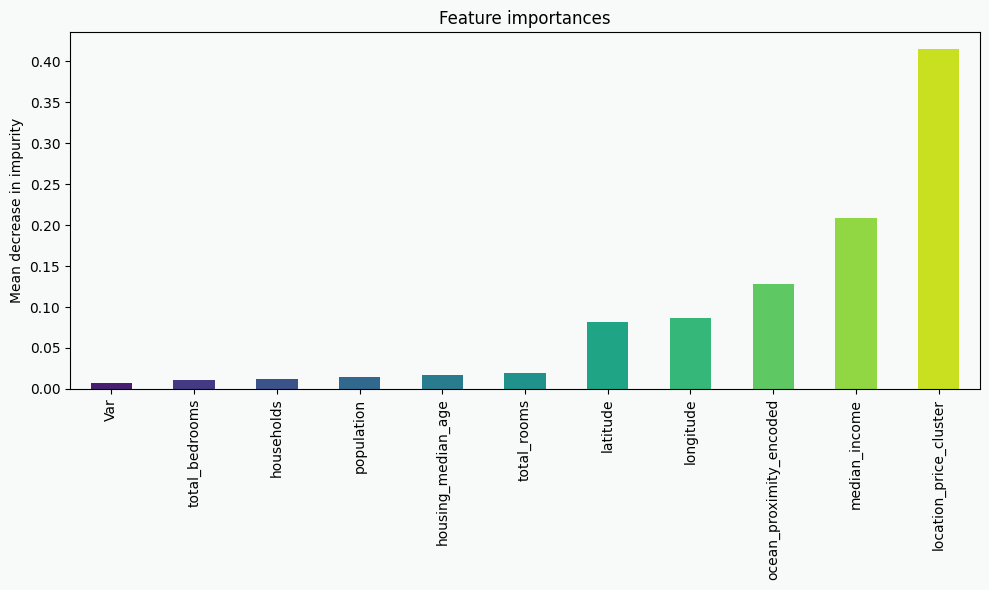

Training accuracy: 91.37111729253593
Test accuracy: 87.06362153344209
---------------
                    Feature  Importance
0    location_price_cluster    0.414649
1             median_income    0.208929
2   ocean_proximity_encoded    0.127907
3                 longitude    0.086559
4                  latitude    0.081226
5               total_rooms    0.019148
6        housing_median_age    0.016385
7                population    0.014778
8                households    0.011623
9            total_bedrooms    0.011214
10                      Var    0.007583
---------------
Las variables que han sido seleccionadas con importancia mayor a 0.055 son:

                   Feature  Importance
0   location_price_cluster    0.414649
1            median_income    0.208929
2  ocean_proximity_encoded    0.127907
3                longitude    0.086559
4                 latitude    0.081226


In [122]:
X = df.drop(['median_house_cat','ocean_proximity','median_house_value'], axis=1)
y = df['median_house_cat']
umbral=0.055
selected_features, forest = entrenar_random_forest(X, umbral)

### 2.5.4 Conclusiones Feature Selection

**Variables muy poco significativas**

- En principio la amyoria de variables se muestran significativas en su relación la la variable objetivo Valor medio de la vivienda.

**Variables más significativas**

- La variable cluster que hemos creado 'location_price_cluster' es la que muestra mayor grado de significación, junto a la mediana del ingreso  (median_income) y la variable codificada 'ocean_proximity_encoded', que obtuvimos ordenando la variable original en función de la proximidad a la costa.  Las coordenadas longitud y latitud tambien muestran significación 

**Variables con significación **

- Las coordenadas longitud y latitud tambien muestran significación, si bien estan ya recogidas en la variable 'location_price_cluster'
- Las variables total_rooms, population, total_bedrooms y households tambien muestran significación, si bien la alta correlación entre ellas nos lleva a considerar tan sólo una de ellas a la hora de entrenar nuestros modelos.



In [124]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,median_house_cat,ocean_proximity_encoded,location_price_cluster,Var
0,-122.23,37.88,41,15.711183,8.812635,12.313702,9.276867,2.339704,NEAR BAY,452600,Alto,3,6,1.054546
1,-122.22,37.86,21,27.567255,17.043806,22.349787,18.837657,2.336226,NEAR BAY,358500,Alto,3,6,0.147243
2,-122.24,37.85,52,18.129399,10.018273,14.089610,10.438155,2.173976,NEAR BAY,352100,Alto,3,6,0.705665
3,-122.25,37.85,52,17.434442,10.726091,14.606008,11.216602,1.875594,NEAR BAY,341300,Alto,3,6,0.612749
4,-122.25,37.85,52,18.653359,11.335470,14.661511,11.859220,1.434004,NEAR BAY,342200,Alto,3,6,0.067338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,18.771858,12.396339,16.544107,12.835209,0.454096,INLAND,78100,Bajo,5,2,0.519440
20636,-121.21,39.49,18,14.695478,9.269814,12.710336,8.952949,0.980434,INLAND,77100,Bajo,5,2,2.270061
20637,-121.22,39.43,17,20.383726,13.409430,17.422049,14.000827,0.543777,INLAND,92300,Bajo,5,2,2.167204
20638,-121.32,39.43,18,19.348787,12.738405,15.910079,13.069100,0.642702,INLAND,84700,Bajo,5,2,1.252053


In [126]:
selected_features

['longitude',
 'latitude',
 'median_income',
 'ocean_proximity_encoded',
 'location_price_cluster']

### 2.6 Reducción de la dimensionalidad de los datos

No se requiere

### 2.7 Guardamos modelo tras EDA

In [128]:
# Eliminamos Var
df=df.drop(columns = ['Var'],axis=1)

# Guardar el DataFrame en un archivo CSV

df.to_csv('C:\MachineLearningInmobiliario\housingEDA.csv', index=False)

<span style="font-size:24px; color:red; font-weight:bold">3. Entrenamiento y evaluación de modelos</span>

In [130]:
# Hacemos dummy variable 'location_price_cluster'
df = pd.get_dummies(df, columns=['location_price_cluster'], drop_first=True)

In [132]:
# Seleccionamos las features que vamos a usar en nuestro entrenamiento, descartando las no significativas
selected_features = ['latitude', 'housing_median_age', 'total_rooms','median_income', 'ocean_proximity_encoded', 'location_price_cluster_1', 
                     'location_price_cluster_2','location_price_cluster_3','location_price_cluster_4','location_price_cluster_5',
                     'location_price_cluster_6','location_price_cluster_7']

In [134]:
X = df[selected_features]
y = df['median_house_value']

Linear Regression

Mean Squared Error: 1154017883.513877
Mean Absolute Error: 27279.8327480133
R^2 Score: 0.9156122393137796
Training Accuracy: 0.9120499635331346
Testing Accuracy: 0.9156122393137796


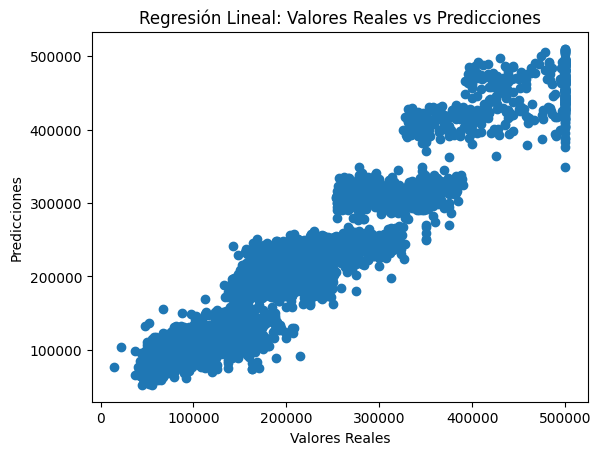

In [136]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar las características, Escala las características para que tengan media 0 y desviación estándar 1
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Crear el modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Hacer predicciones
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R^2 Score: {r2}")
print(f'Training Accuracy: {model.score(X_train, y_train)}')
print(f"Testing Accuracy: {model.score(X_test, y_test)}")

# Visualizar los resultados
plt.scatter(y_test, y_pred)
plt.xlabel("Valores Reales")
plt.ylabel("Predicciones")
plt.title("Regresión Lineal: Valores Reales vs Predicciones")
plt.show()

In [138]:
print('intercept:', model.intercept_)
cdf = pd.DataFrame(model.coef_, X.columns, columns=['coef'])
cdf

intercept: 206644.40009788328


,coef
latitude,-11760.490824
housing_median_age,1507.036278
total_rooms,1863.747879
median_income,18404.604220
ocean_proximity_encoded,-6543.105645
location_price_cluster_1,18630.249126
location_price_cluster_2,-15568.589564
location_price_cluster_3,31004.725868
location_price_cluster_4,-19305.775052
location_price_cluster_5,-24670.758951


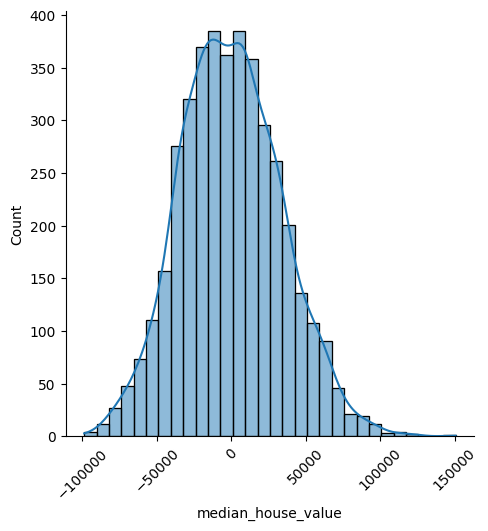

In [140]:
residuals = y_test - y_pred
sns.displot(residuals, bins = 30, kde = True)
plt.xticks(rotation=45)
plt.show()

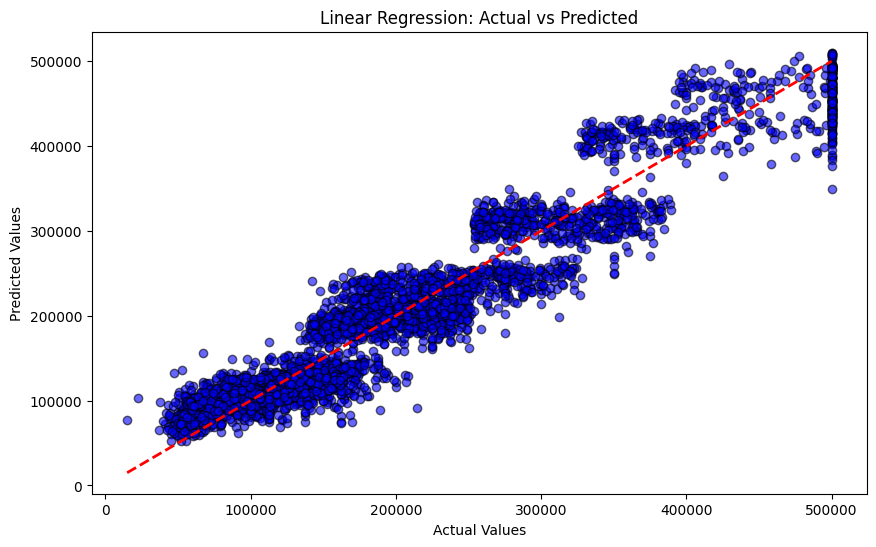

In [142]:
plt.figure(figsize=(10,6))  # Crea una figura de tamaño 10x6 pulgadas
plt.scatter(y_test, y_pred, color='blue', edgecolor='k', alpha=0.6)  # Dibuja un gráfico de dispersión con los valores reales y predichos
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Dibuja una línea roja discontinua que representa la línea de igualdad
plt.xlabel('Actual Values')  # Etiqueta del eje X
plt.ylabel('Predicted Values')  # Etiqueta del eje Y
plt.title('Linear Regression: Actual vs Predicted')  # Título del gráfico
plt.show()  # Muestra el gráfico


In [146]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import numpy as np

def fit_poly(x, y, degree=1):
    # Añadir características polinómicas
    polynomial_features = PolynomialFeatures(degree=degree)
    
    # Crear y ajustar el modelo
    linear_regression = LinearRegression()
    model = Pipeline([("polynomial_features", polynomial_features), ("linear_regression", linear_regression)])
    model.fit(x, y)
    
    return model

# Ejemplo de uso con diferentes grados de polinomios
degrees = [1, 2, 3]
for d in degrees:
    model = fit_poly(X_train, y_train, degree=d)
    y_pred = model.predict(X_test)
    
    # Evaluar el modelo
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    print(f'Degree: {d}')
    print(f'Mean Squared Error: {mse}')
    print(f"Mean Absolute Error: {mae}")
    print(f'R-squared: {r2}')

Degree: 1
Mean Squared Error: 1154017883.513877
Mean Absolute Error: 27279.832748013294
R-squared: 0.9156122393137796
Degree: 2
Mean Squared Error: 1024889713.2468803
Mean Absolute Error: 25352.091020308293
R-squared: 0.9250547594740053
Degree: 3
Mean Squared Error: 970045061.6064513
Mean Absolute Error: 24633.09935466112
R-squared: 0.9290652842706049


In [148]:

print("degree={}, The Training Accuracy={:.2f}, The Testing Accuracy={:.2f}, \n".format(d, model.score(X_train, y_train, sample_weight=None), model.score(X_test, y_test)))

degree=3, The Training Accuracy=0.93, The Testing Accuracy=0.93, 



In [150]:
from sklearn.ensemble import RandomForestRegressor

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definir el modelo
rf = RandomForestRegressor(random_state=42)

# Definir la rejilla de parámetros para la búsqueda
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20],
    'min_samples_split': [10, 20],
    'min_samples_leaf': [10, 20], # nodo terminal
    'max_features': ['auto', 'sqrt', 'log2']
}

# Búsqueda en rejilla con validación cruzada
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Mejor modelo encontrado
best_rf = grid_search.best_estimator_

# Evaluar el modelo en el conjunto de prueba
y_pred = best_rf.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f"Mean Absolute Error: {mae}")
print(f"R-Squared: {r2}")


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Mean Squared Error: 918105099.7872775
Mean Absolute Error: 23838.762125847526
R-Squared: 0.9328634031131844


In [152]:
# Evaluar la precisión en el conjunto de entrenamiento
training_accuracy = best_rf.score(X_train, y_train)
print(f'Training Accuracy: {training_accuracy}')

# Evaluar la precisión en el conjunto de prueba
testing_accuracy = best_rf.score(X_test, y_test)
print(f'Testing Accuracy: {testing_accuracy}')


Training Accuracy: 0.9433333734575827
Testing Accuracy: 0.9328634031131844


In [154]:
# Obtener los mejores parámetros
best_params = grid_search.best_params_
print(f'Mejores parámetros: {best_params}')

# Obtener la mejor puntuación
best_score = grid_search.best_score_
print(f'Mejor puntuación: {best_score}')


Mejores parámetros: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 200}
Mejor puntuación: 0.9286704284680882


In [ ]:
# Visualizar los resultados

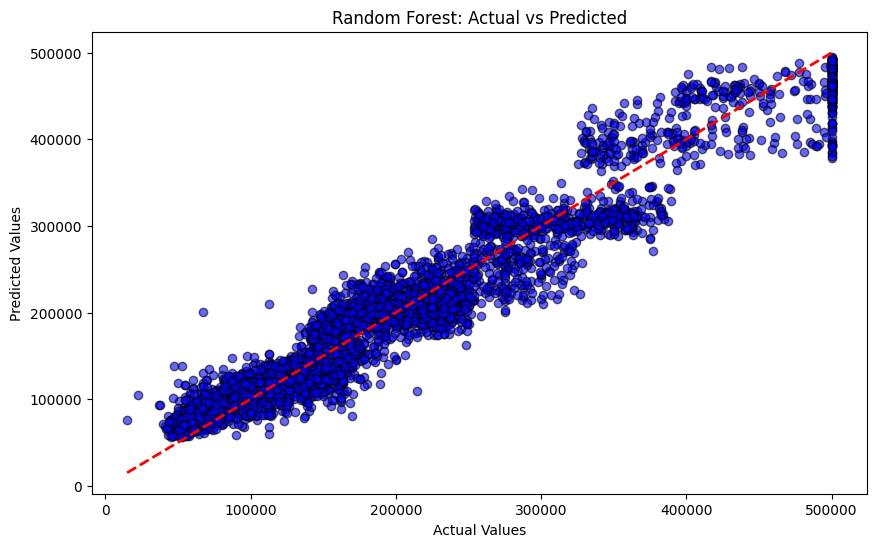

In [156]:
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred, color='blue', edgecolor='k', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest: Actual vs Predicted')
plt.show()

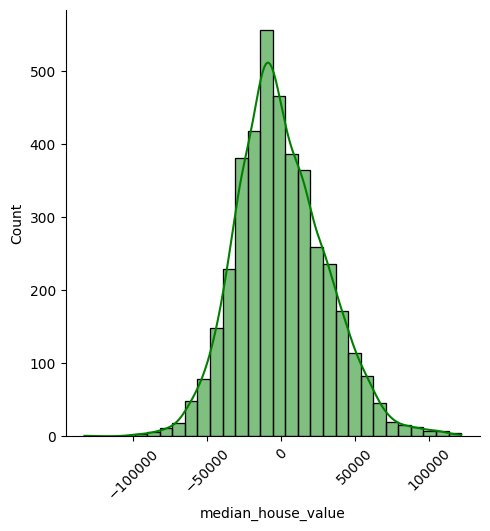

In [158]:
rf_residuals = y_test - y_pred
sns.displot(rf_residuals, bins = 30, kde = True,color='green')
plt.xticks(rotation=45)
plt.show()

Xgboost Regression

In [160]:
from xgboost import XGBRegressor

params = {
            'objective':'reg:squarederror',  # Para regresión,
            'max_depth': 4,
            'alpha': 10,
            'learning_rate': 1.0,
            'n_estimators':100
        }
XGB_reg = XGBRegressor()
# fit the model
XGB_reg.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Métricas de rendimiento:
Error cuadrático medio (MSE): 924862586.5607
Raíz del error cuadrático medio (RMSE): 30411.5535
Error absoluto medio (MAE): 23337.0838
Coeficiente de determinación (R²): 0.9324
Precisión de entrenamiento: 0.9642
Precisión de prueba: 0.9324
Puntuaciones de validación cruzada: [0.92636356 0.92324726 0.92834239 0.93311025 0.92973656]
Media de validación cruzada: 0.9282


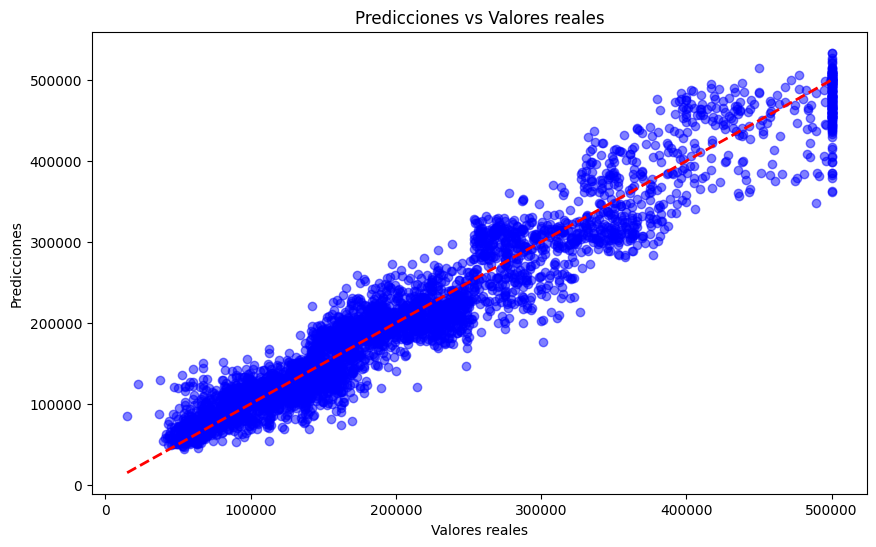

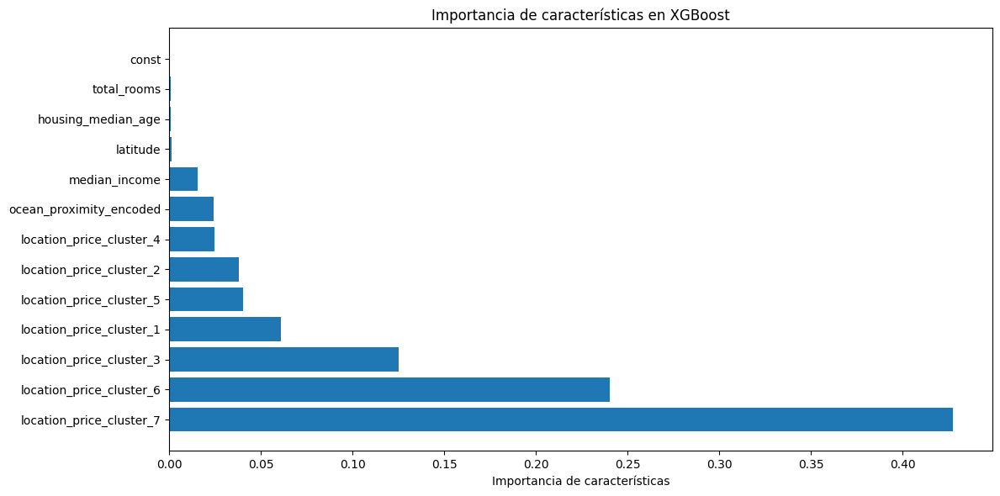


Importancia de características:
location_price_cluster_7: 0.4277
location_price_cluster_6: 0.2404
location_price_cluster_3: 0.1252
location_price_cluster_1: 0.0611
location_price_cluster_5: 0.0406
location_price_cluster_2: 0.0379
location_price_cluster_4: 0.0248
ocean_proximity_encoded: 0.0241
median_income: 0.0154
latitude: 0.0013
housing_median_age: 0.0008
total_rooms: 0.0006
const: 0.0000


In [162]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

# Predicciones
y_pred = XGB_reg.predict(X_test)

# Métricas de rendimiento
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Puntuaciones de entrenamiento y prueba
training_score_XGB = XGB_reg.score(X_train, y_train)
testing_score_XGB = XGB_reg.score(X_test, y_test)

# Validación cruzada
cv_scores = cross_val_score(XGB_reg, X_train, y_train, cv=5)

print('Métricas de rendimiento:')
print(f'Error cuadrático medio (MSE): {mse:.4f}')
print(f'Raíz del error cuadrático medio (RMSE): {rmse:.4f}')
print(f'Error absoluto medio (MAE): {mae:.4f}')
print(f'Coeficiente de determinación (R²): {r2:.4f}')
print(f'Precisión de entrenamiento: {training_score_XGB:.4f}')
print(f'Precisión de prueba: {testing_score_XGB:.4f}')
print(f'Puntuaciones de validación cruzada: {cv_scores}')
print(f'Media de validación cruzada: {np.mean(cv_scores):.4f}')

# Visualización de predicciones vs valores reales
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('Predicciones vs Valores reales')
plt.show()

# Importancia de características
feature_importance = XGB_reg.feature_importances_
feature_names = X.columns  # Usamos directamente los nombres de las columnas del DataFrame X
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})
importance_df = importance_df.sort_values('importance', ascending=False)

# Crear el gráfico de importancia de características
plt.figure(figsize=(12, 6))
plt.barh(importance_df['feature'], importance_df['importance'])
plt.xlabel('Importancia de características')
plt.title('Importancia de características en XGBoost')
plt.tight_layout()
plt.show()

# Imprimir la importancia de características
print("\nImportancia de características:")
for index, row in importance_df.iterrows():
    print(f"{row['feature']}: {row['importance']:.4f}")

In [164]:
X

,const,latitude,housing_median_age,total_rooms,median_income,ocean_proximity_encoded,location_price_cluster_1,location_price_cluster_2,location_price_cluster_3,location_price_cluster_4,location_price_cluster_5,location_price_cluster_6,location_price_cluster_7
0,1.0,37.88,41,15.711183,2.339704,3,False,False,False,False,False,True,False
1,1.0,37.86,21,27.567255,2.336226,3,False,False,False,False,False,True,False
2,1.0,37.85,52,18.129399,2.173976,3,False,False,False,False,False,True,False
3,1.0,37.85,52,17.434442,1.875594,3,False,False,False,False,False,True,False
4,1.0,37.85,52,18.653359,1.434004,3,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,1.0,39.48,25,18.771858,0.454096,5,False,True,False,False,False,False,False
20636,1.0,39.49,18,14.695478,0.980434,5,False,True,False,False,False,False,False
20637,1.0,39.43,17,20.383726,0.543777,5,False,True,False,False,False,False,False
20638,1.0,39.43,18,19.348787,0.642702,5,False,True,False,False,False,False,False


In [166]:
def entrenar_modelos(X, y):
    df_metricas = pd.DataFrame(columns=['Modelo', 'R2', 'Mean absolute error'])

    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
    
    # Definiendo los modelos que vamos a utilizar
    modelos = [
        RandomForestRegressor(max_depth=20, min_samples_split=10, n_estimators=300, min_samples_leaf=10,
                              max_features='sqrt', random_state=42),
        XGBRegressor(max_depth=4, n_estimators=100, alpha=10, learning_rate=0.1,
                     objective='reg:squarederror', random_state=42),
        LinearRegression(),
        Pipeline([
            ('poly', PolynomialFeatures(degree=2)),
            ('linear', LinearRegression())
        ]),
        Pipeline([
            ('poly', PolynomialFeatures(degree=3)),
            ('linear', LinearRegression())
        ])
    ]
    
    # Imprimir los conjuntos de datos
    print("X_train:\n", X_train.shape)
    print("X_test:\n", X_test.shape)
    print("y_train:\n", y_train.shape)
    print("y_test:\n", y_test.shape) 

    num = 0
    for modelo in modelos:
        print("-"*50)
        print(f'Modelo: {type(modelo).__name__}')

        pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('modelo', modelo)
        ])
    
        # Entrenar el modelo
        pipe.fit(X_train, y_train)

        # Obtener las predicciones para nuevos datos, usando los datos de prueba
        y_pred = pipe.predict(X_test)

        # Evaluar el modelo
        mse = round(mean_squared_error(y_test, y_pred), 2)
        r2 = round(r2_score(y_test, y_pred), 2)
        mae = round(mean_absolute_error(y_test, y_pred), 2)

        print(f'Mean Squared Error: {mse}')
        print(f"Mean Absolute Error: {mae}")
        print(f"R-Squared: {r2}")

       # Visualización de predicciones vs valores reales
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

        # Gráfico de dispersión de predicciones vs valores reales
        ax1.scatter(y_test, y_pred, color='blue', alpha=0.5)
        ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        ax1.set_xlabel('Valores reales')
        ax1.set_ylabel('Predicciones')
        ax1.set_title('Predicciones vs Valores reales')

        # Histograma de residuos
        rf_residuals = y_test - y_pred
        sns.histplot(rf_residuals, bins=30, kde=True, color='green', ax=ax2)
        ax2.set_title('Histograma de Residuos')
        #ax2.set_xticks(ax2.get_xticks(), rotation=45)
        plt.setp(ax2.get_xticklabels(), rotation=45)  # Rotar las etiquetas de los ejes x

        plt.tight_layout()
        plt.show()
        
        if isinstance(modelo, Pipeline):
            poly_features = modelo.named_steps.get('poly')
            if poly_features:
                if poly_features.degree == 2:
                    nombre_modelo = 'Polynomial Regression (Degree 2)'
                elif poly_features.degree == 3:
                    nombre_modelo = 'Polynomial Regression (Degree 3)'
        else:
            nombre_modelo = type(modelo).__name__

        df_metricas.loc[num] = [nombre_modelo, r2, mae]

        # Añadiendo importancia de características
        if hasattr(modelo, 'feature_importances_'):
            # Modelos como RandomForest y XGBoost
            feature_importance = modelo.feature_importances_
            importance_df = pd.DataFrame({
                'feature': X.columns,
                'importance': feature_importance
            }).sort_values(by='importance', ascending=False)
       
            # Crear el gráfico de importancia de características
            plt.figure(figsize=(8, 4))
            plt.barh(importance_df['feature'], importance_df['importance'])
            plt.xlabel('Importancia de características')
            plt.title(f'Importancia de características')
            plt.tight_layout()
            plt.show()
        
        num += 1

    return df_metricas


Para intentar predecir el precio medio de la vivienda de cada bloque en función de las caracteristicas de las que disponemos, usaremos los siguientes modelos de Machine Learning: 

1. RandomForestRegressor

Descripción: Es un modelo de aprendizaje automático basado en árboles de decisión. Crea múltiples árboles de decisión y promedia sus predicciones.
Ventajas: Es robusto frente a sobreajuste y maneja bien datos no lineales y características categóricas.

Apropiado para estimar precios de viviendas: Puede capturar relaciones complejas entre las características (como tamaño, ubicación, número de habitaciones) y el precio.

2. XGBRegressor (XGBoost)

Descripción: Es una implementación optimizada de gradient boosting. Construye árboles de decisión secuencialmente, donde cada árbol corrige los errores del anterior.
Ventajas: Alta precisión, manejo eficiente de datos faltantes y regularización para evitar sobreajuste.

Apropiado para estimar precios de viviendas: Su capacidad para manejar datos complejos y su precisión lo hacen ideal para este tipo de tareas.

3. LinearRegression

Descripción: Es un modelo de regresión lineal simple que asume una relación lineal entre las características y la variable objetivo.
Ventajas: Fácil de interpretar y rápido de entrenar.
    
Apropiado para estimar precios de viviendas: Funciona bien si la relación entre las características y el precio es aproximadamente lineal.
    
4. PolynomialFeatures (degree=2 y 3)
        
Descripción: Transforma las características originales en características polinómicas de segundo y tercer grado.
Ventajas: Captura relaciones no lineales más complejas que la regresión lineal simple.
Apropiado para estimar precios de viviendas: Útil si hay relaciones cúbicas entre las características y el precio, aunque puede ser más propenso al sobreajuste.

5. Multilayer Perceptron (Perceptrón Multicapa).

Descripción: Es un tipo de red neuronal artificial que se utiliza comúnmente en problemas de clasificación y regresión.

Ventajas: 

Capacidad de Capturar Relaciones Complejas: Las redes neuronales son muy buenas para capturar relaciones no lineales complejas entre las características y la variable objetivo.
Flexibilidad: Puedes ajustar el número de capas y neuronas para mejorar el rendimiento del modelo.
Generalización: Con suficiente entrenamiento y datos, las redes neuronales pueden generalizar bien a nuevos dat

Este modelo es adecuado para estimar el precio medio de una vivienda porque:

Relaciones No Lineales: Puede capturar relaciones complejas entre las características de la vivienda (como tamaño, ubicación, número de habitaciones) y el precio.
Escalabilidad: Puede manejar grandes conjuntos de datos y aprender patrones complejos.
Personalización: Puedes ajustar la arquitectura del modelo (número de capas y neuronas) según las necesidades específicas del problema.os.



X_train:
 (14303, 12)
X_test:
 (6130, 12)
y_train:
 (14303,)
y_test:
 (6130,)
--------------------------------------------------
Modelo: RandomForestRegressor
Mean Squared Error: 923243217.92
Mean Absolute Error: 23787.0
R-Squared: 0.93


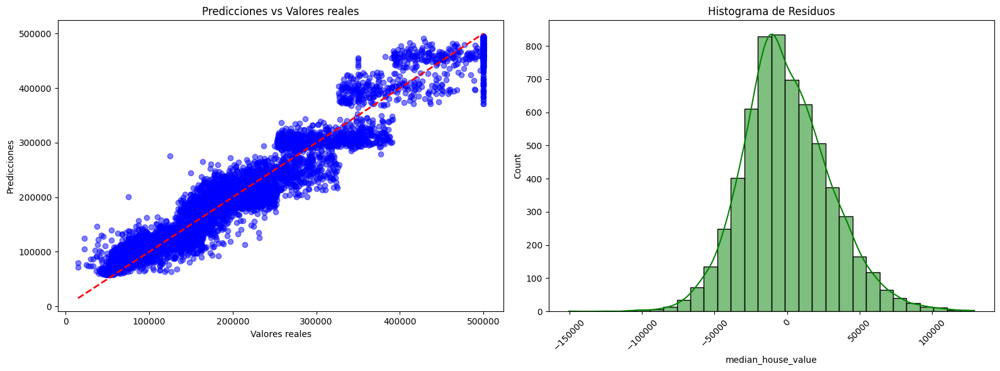

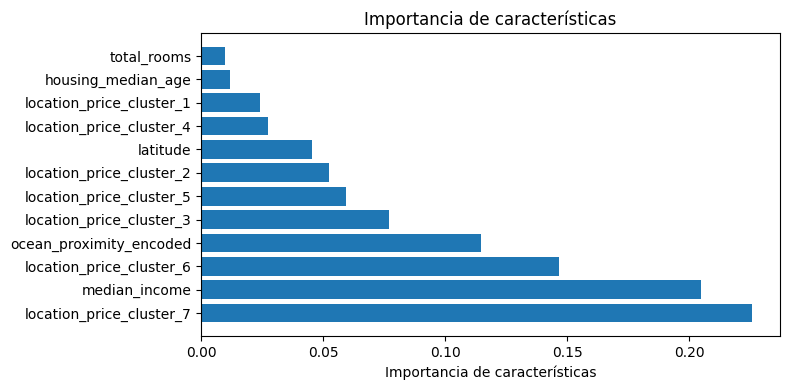

--------------------------------------------------
Modelo: XGBRegressor
Mean Squared Error: 975615315.66
Mean Absolute Error: 24375.89
R-Squared: 0.93


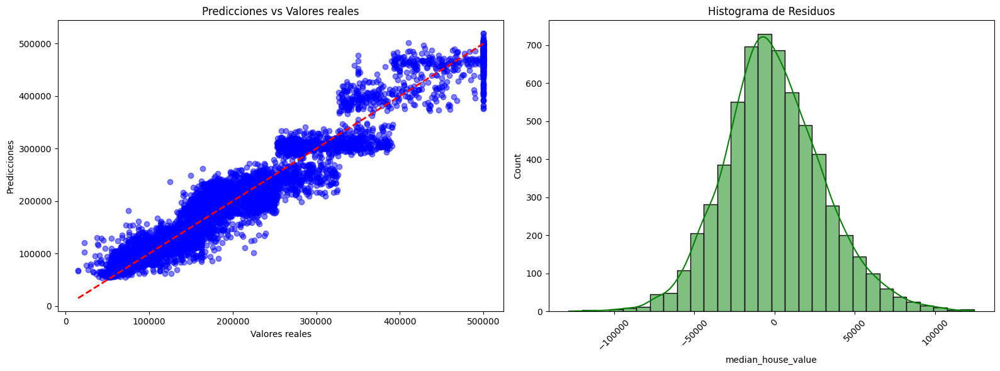

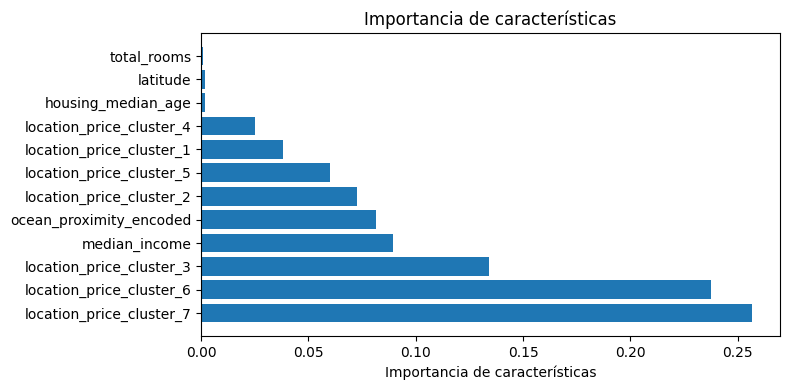

--------------------------------------------------
Modelo: LinearRegression
Mean Squared Error: 1154992654.74
Mean Absolute Error: 27109.78
R-Squared: 0.91


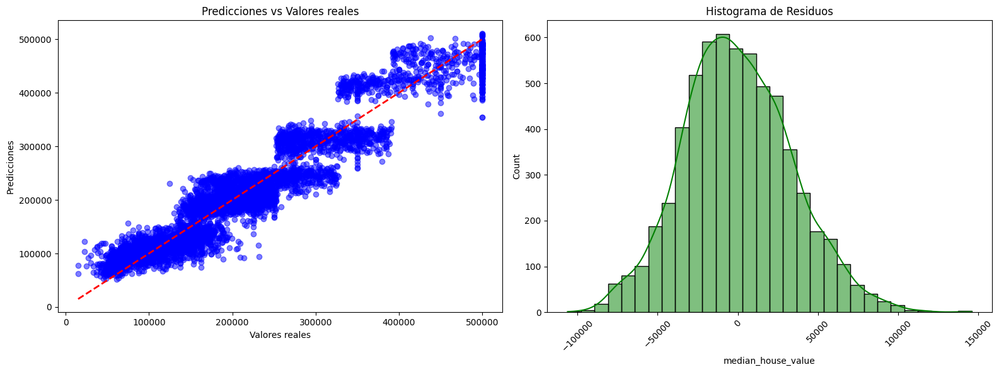

--------------------------------------------------
Modelo: Pipeline
Mean Squared Error: 1050115272.06
Mean Absolute Error: 25389.13
R-Squared: 0.92


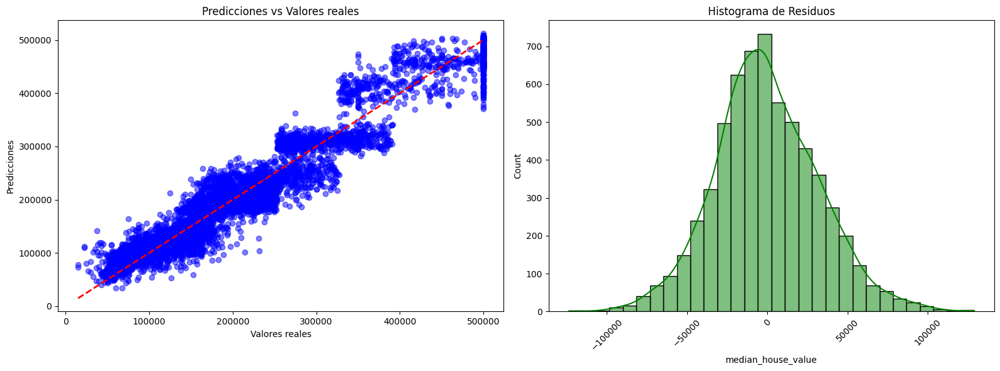

--------------------------------------------------
Modelo: Pipeline
Mean Squared Error: 980949257.01
Mean Absolute Error: 24491.09
R-Squared: 0.93


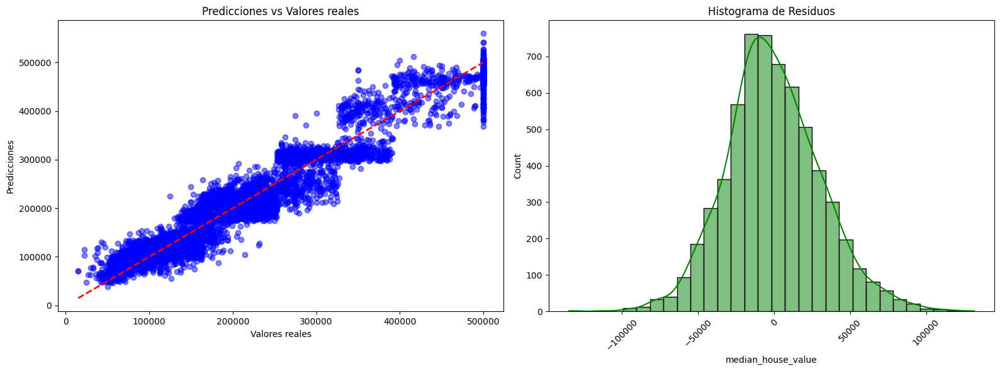

In [168]:
# Entrenar modelos
X = df[selected_features]
y = df['median_house_value']
df_metricas = entrenar_modelos (X,y)

5. Multilayer Perceptron (Perceptrón Multicapa).

Descripción: Es un tipo de red neuronal artificial que se utiliza comúnmente en problemas de clasificación y regresión.

In [170]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Definir el modelo de red neuronal
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Entrenar el modelo
history = model.fit(X_train_scaled, y_train, epochs=100, validation_split=0.2, verbose=1)

# Evaluar el modelo
train_loss = model.evaluate(X_train_scaled, y_train, verbose=0)
test_loss = model.evaluate(X_test_scaled, y_test, verbose=0)
print(f'Training Loss: {train_loss}')
print(f'Testing Loss: {test_loss}')

# Hacer predicciones
y_pred = model.predict(X_test_scaled)


Epoch 1/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 56281493504.0000 - val_loss: 55723548672.0000
Epoch 2/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 54888128512.0000 - val_loss: 50705059840.0000
Epoch 3/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 48056586240.0000 - val_loss: 39464202240.0000
Epoch 4/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 35522674688.0000 - val_loss: 25077661696.0000
Epoch 5/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 21854621696.0000 - val_loss: 13422223360.0000
Epoch 6/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 11555914752.0000 - val_loss: 7418573824.0000
Epoch 7/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 6607191552.0000 - val_loss: 5147730944.0000
Epoch 8/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 4850028544.0000 - val_loss: 4027999744.0000
Epoch 9/100
409/409 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 3751433728.0000 - val_loss: 3218811136.0000
Epoch 10/100
409/409 ━━━━━━━━━

--------------------------------------------------
Modelo: Multilayer Perceptron
Mean Squared Error: 1086347247.62
Mean Absolute Error: 26446.86
R-Squared: 0.92


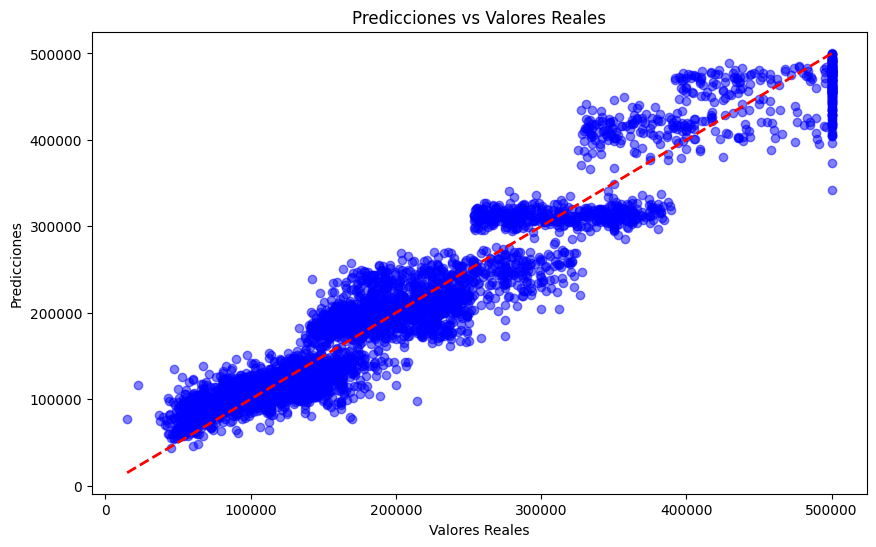

In [172]:
 # Evaluar el modelo
mse = round(mean_squared_error(y_test, y_pred), 2)
r2 = round(r2_score(y_test, y_pred), 2)
mae = round(mean_absolute_error(y_test, y_pred), 2)

print("-"*50)
print(f'Modelo: Multilayer Perceptron')
print(f'Mean Squared Error: {mse}')
print(f"Mean Absolute Error: {mae}")
print(f"R-Squared: {r2}")

# Visualizar las predicciones
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Predicciones vs Valores Reales')
plt.show()


In [174]:
nombre_modelo = "Multilayer Perceptron"

In [176]:
df_metricas.loc[5] = [nombre_modelo, r2, mae]

<span style="font-size:24px; color:red; font-weight:bold">4. Modelo Final</span>

In [178]:
df_metricas

,Modelo,R2,Mean absolute error
0,RandomForestRegressor,0.93,23787.00
1,XGBRegressor,0.93,24375.89
2,LinearRegression,0.91,27109.78
3,Polynomial Regression (Degree 2),0.92,25389.13
4,Polynomial Regression (Degree 3),0.93,24491.09
5,Multilayer Perceptron,0.92,26446.86


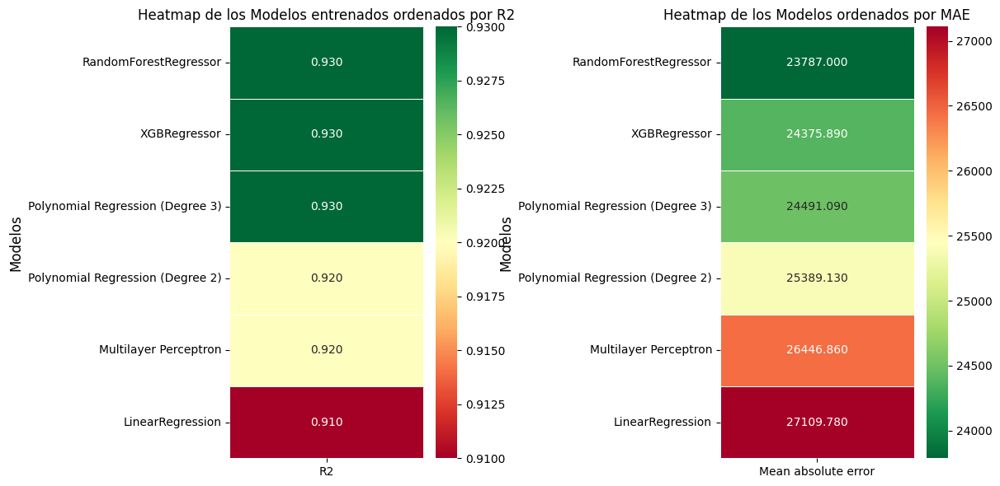

In [180]:
# Crear una figura con dos subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primer heatmap: solo con la variable 'R2'
heatmap_data_r2 = df_metricas[['Modelo', 'R2']].set_index('Modelo').sort_values(by='R2', ascending=False)
sns.heatmap(heatmap_data_r2, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f', ax=axes[0])
axes[0].set_title('Heatmap de los Modelos entrenados ordenados por R2', fontsize=12)
axes[0].set_ylabel('Modelos', fontsize=12)
#axes[0].set_xlabel('R2', fontsize=12)

# Segundo heatmap: solo con la variable 'Mean absolute error'
heatmap_data_mae = df_metricas[['Modelo', 'Mean absolute error']].set_index('Modelo').sort_values(by='Mean absolute error', ascending=True)
sns.heatmap(heatmap_data_mae, annot=True, cmap='RdYlGn_r', linewidths=.5, fmt='.3f', ax=axes[1])  # Usar 'RdYlGn_r' para invertir los colores
axes[1].set_title('Heatmap de los Modelos ordenados por MAE', fontsize=12)
axes[1].set_ylabel('Modelos', fontsize=12)
#axes[1].set_xlabel('Mean absolute error', fontsize=12)

# Ajustar el layout para que no se solapen los títulos y etiquetas
plt.tight_layout()
plt.show()

De todos los modelos entrenados nos quedamos con el RandomForest que ha dado un alto nivel de precisión, con R2 del orden de 0.93*, que sugiere un alto poder predictivo.

* En términos simples, un R² de 0.93 significa que el 93% de la variabilidad en los precios de las viviendas puede ser explicada por el modelo basándose en las variables que ha utilizado, lo que muestra un modelo muy preciso.



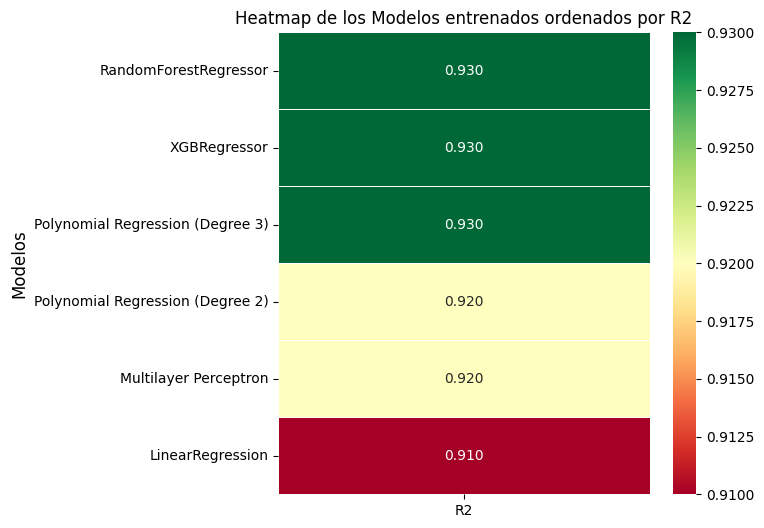

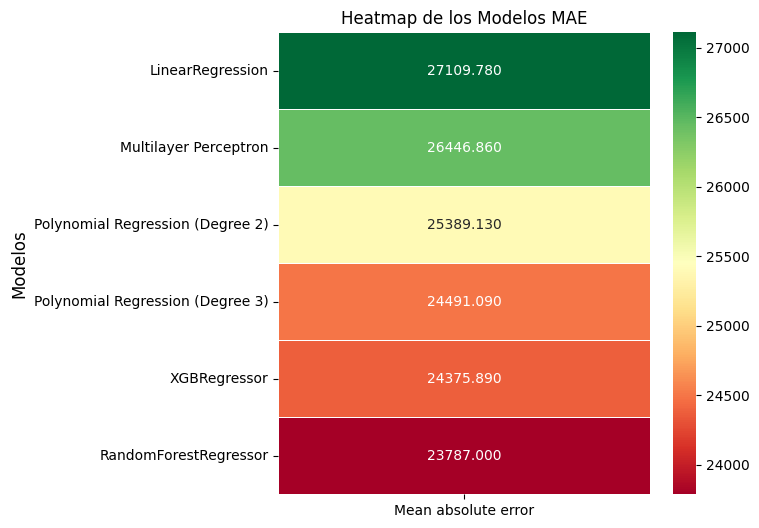

In [182]:
# Crear el heatmap solo con la variable 'R2'
plt.figure(figsize=(6, 6))
heatmap_data = df_metricas[['Modelo', 'R2']].set_index('Modelo').sort_values(by='R2', ascending=False)
sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f')

# Configurar el título y las etiquetas
plt.title('Heatmap de los Modelos entrenados ordenados por R2', fontsize=12)
#plt.xlabel('R2', fontsize=12)
plt.ylabel('Modelos', fontsize=12)
plt.show()

# Crear el heatmap solo con la variable 'R2'
plt.figure(figsize=(6, 6))
heatmap_data = df_metricas[['Modelo', 'Mean absolute error']].set_index('Modelo').sort_values(by='Mean absolute error', ascending=False)
sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f')

# Configurar el título y las etiquetas
plt.title('Heatmap de los Modelos MAE', fontsize=12)
#plt.xlabel('R2', fontsize=12)
plt.ylabel('Modelos', fontsize=12)
plt.show()

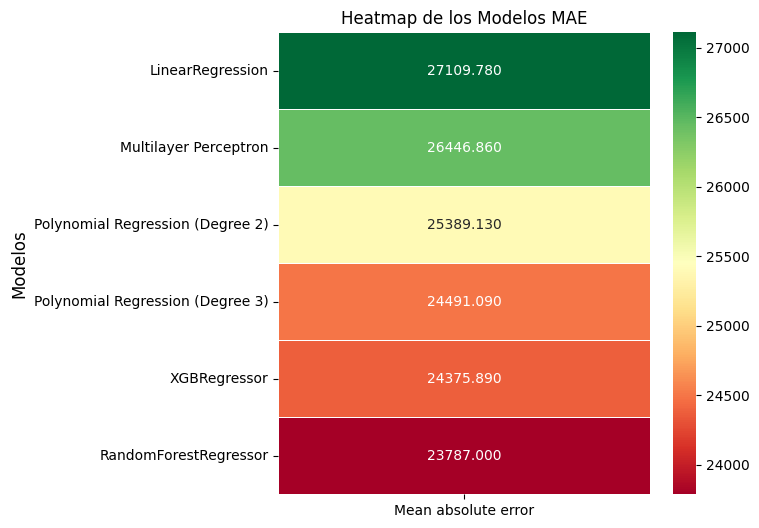

In [186]:
# Crear el heatmap solo con la variable 'R2'
plt.figure(figsize=(6, 6))
heatmap_data = df_metricas[['Modelo', 'Mean absolute error']].set_index('Modelo').sort_values(by='Mean absolute error', ascending=False)
sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f')

# Configurar el título y las etiquetas
plt.title('Heatmap de los Modelos MAE', fontsize=12)
#plt.xlabel('R2', fontsize=12)
plt.ylabel('Modelos', fontsize=12)
plt.show()